In [1]:
%%capture
import os
import site
site.addsitedir('/home/schirrmr/.local/lib/python2.7/site-packages/')
site.addsitedir('/usr/lib/pymodules/python2.7/')
os.sys.path.insert(0, '/home/schirrmr/braindecode/code/')
%cd /home/schirrmr/braindecode/code/braindecode/
assert 'THEANO_FLAGS' in os.environ
# switch to cpu
#os.environ['THEANO_FLAGS'] = 'floatX=float32,device=cpu,nvcc.fastmath=True'
%load_ext autoreload
%autoreload 2

In [2]:
import matplotlib
from matplotlib import pyplot as plt
from matplotlib import cm
%matplotlib inline
%config InlineBackend.figure_format = 'png' 

import matplotlib.lines as mlines
import seaborn
seaborn.set_style('darkgrid')
matplotlib.rcParams['figure.figsize'] = (12.0, 1.0)
matplotlib.rcParams['font.size'] = 7
import theano.tensor as T
import lasagne
import logging
log = logging.getLogger()
log.setLevel("DEBUG")

Using gpu device 0: GeForce GTX 780 (CNMeM is disabled)


# Visualization BhNo

I show:

* Weights of first layer
* Relevance Heatmaps for first 10 trials
* Pattern Inversions for first 10 trials and first 3 conv/pool layers

This was trained without common average reference which in our case means Cz is useless. This sometimes also helps judge visualizations whether they correctly show Cz to be ignored.

## Weights

Weights have a length of 20 samples= 40ms. So a period of 25 Hz. We see some weights (e.g. weight 6) with 3 peaks= ~75Hz?

In [17]:
from braindecode.analysis.plot_util import plot_head_signals_tight
from braindecode.analysis.movie_util import movie_head_signals_tight
from braindecode.datasets.sensor_positions import tight_C_positions
fig = plot_head_signals_tight(combined_weights[0], exp.dataset.sets[0].sensor_names,
                              sensor_map=tight_C_positions,
                        figsize=(14,10))
plt.tight_layout()
movie_head_signals_tight(fig, combined_weights, "Weight")

### FFT of Weights

First mean over all sensors and weights.

### Mean with standard error

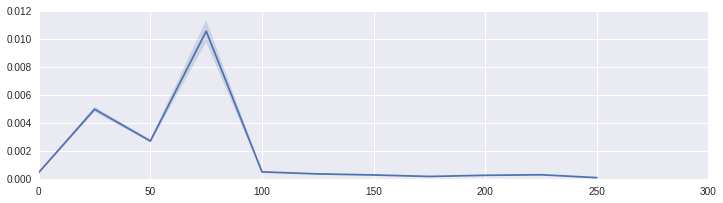

In [36]:
from braindecode.analysis.plot_util import plot_with_tube
plt.figure(figsize=(12,3))
plot_with_tube(freqs, np.mean(bps,axis=(0,1)), np.std(bps,axis=(0,1)) / np.sqrt(np.prod(bps.shape[:2])))

### Median with standard error

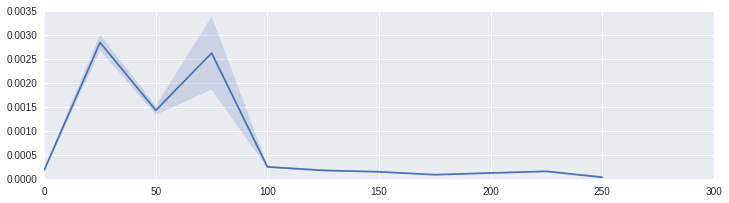

In [37]:
from braindecode.analysis.plot_util import plot_with_tube
plt.figure(figsize=(12,3))
plot_with_tube(freqs, np.median(bps.reshape(-1,bps.shape[2]),axis=(0)),
               np.std(bps,axis=(0,1)) / np.sqrt(np.prod(bps.shape[:2])))

## Mean for each sensor

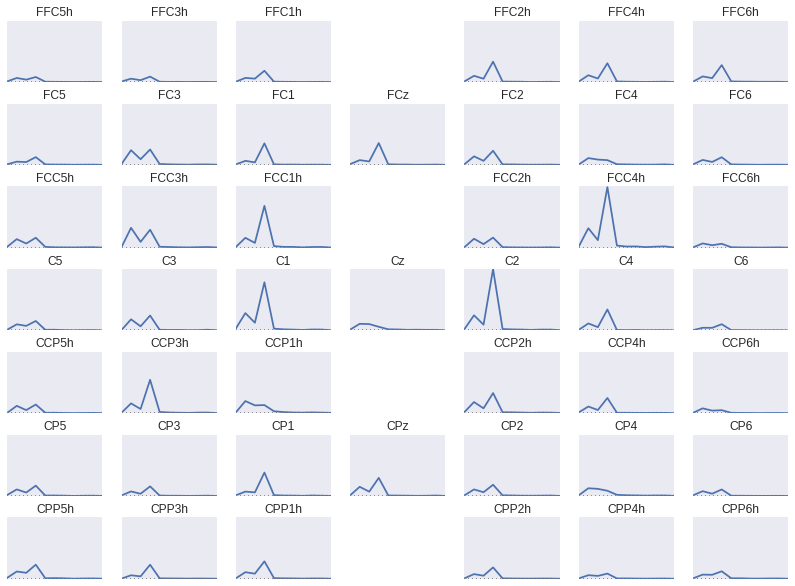

In [19]:
plot_head_signals_tight(np.mean(bps,axis=(0)), exp.dataset.sets[0].sensor_names,
                              sensor_map=tight_C_positions,
                        figsize=(14,10))
None

## Median for each sensor

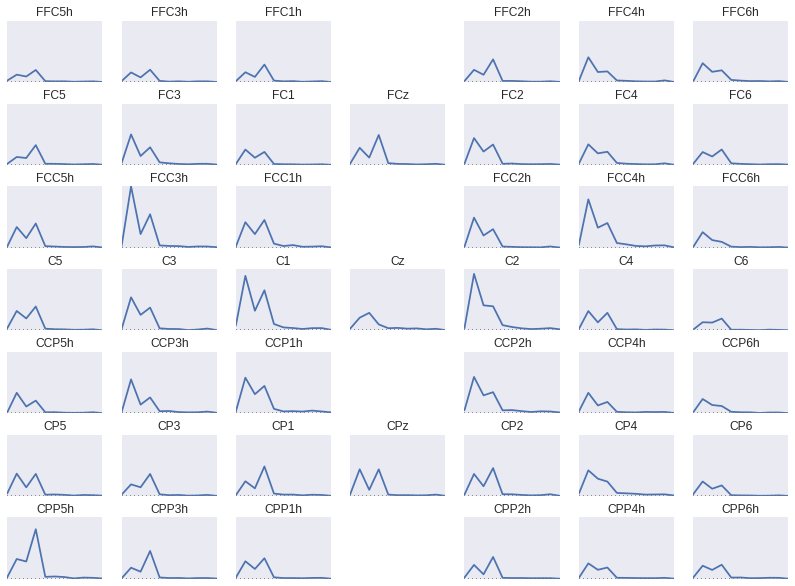

In [38]:
plot_head_signals_tight(np.median(bps,axis=(0)), exp.dataset.sets[0].sensor_names,
                              sensor_map=tight_C_positions,
                        figsize=(14,10))
None

## Heatmaps

Should show which part was how relevant for the classifier decision. We look at first 10 trials. More red means more relevant.

See http://arxiv.org/abs/1512.02479 ...

(Not respecting biases yet...)


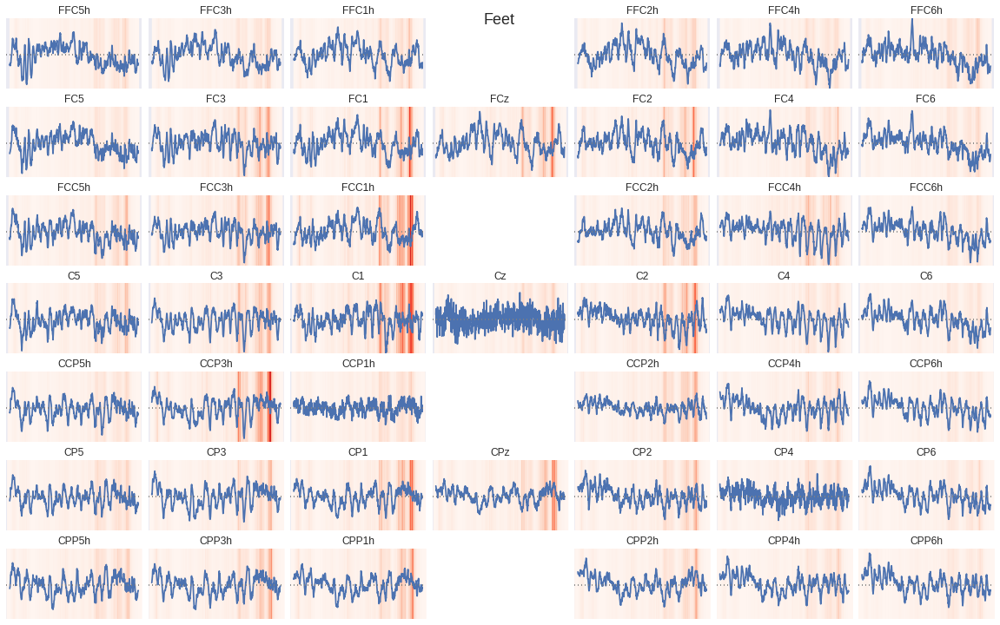

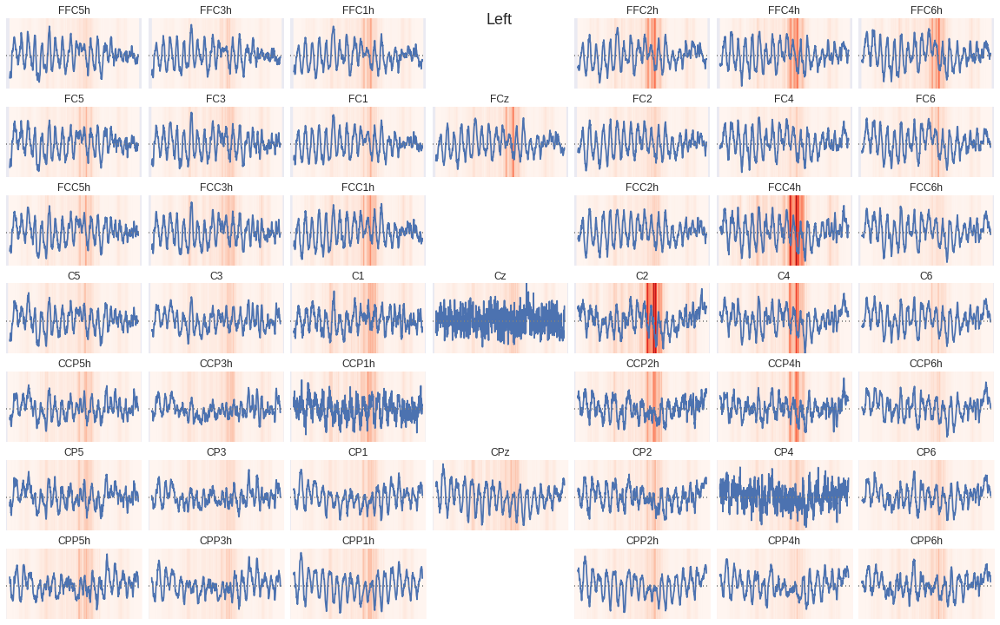

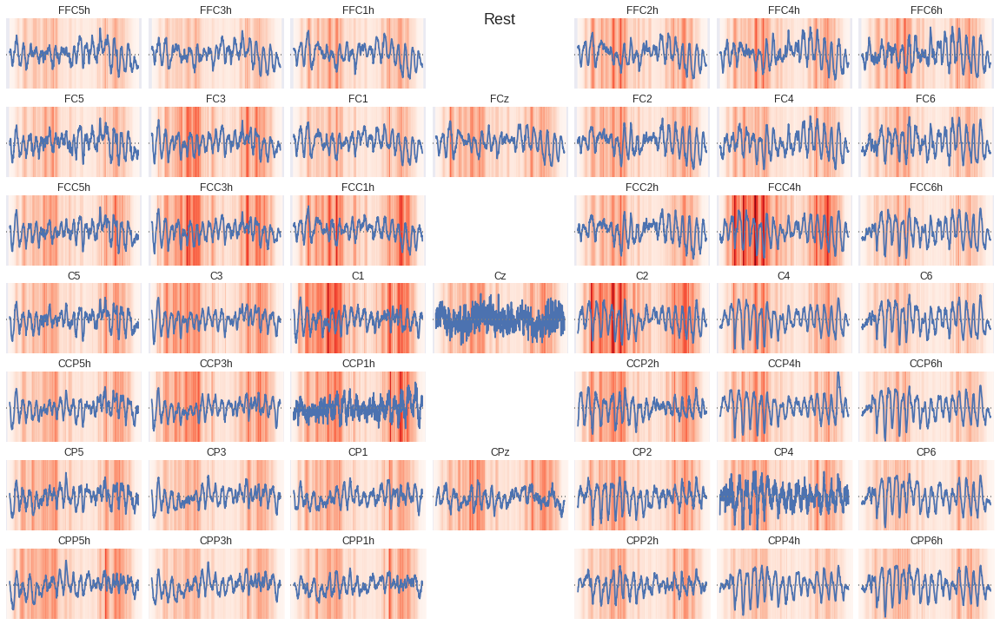

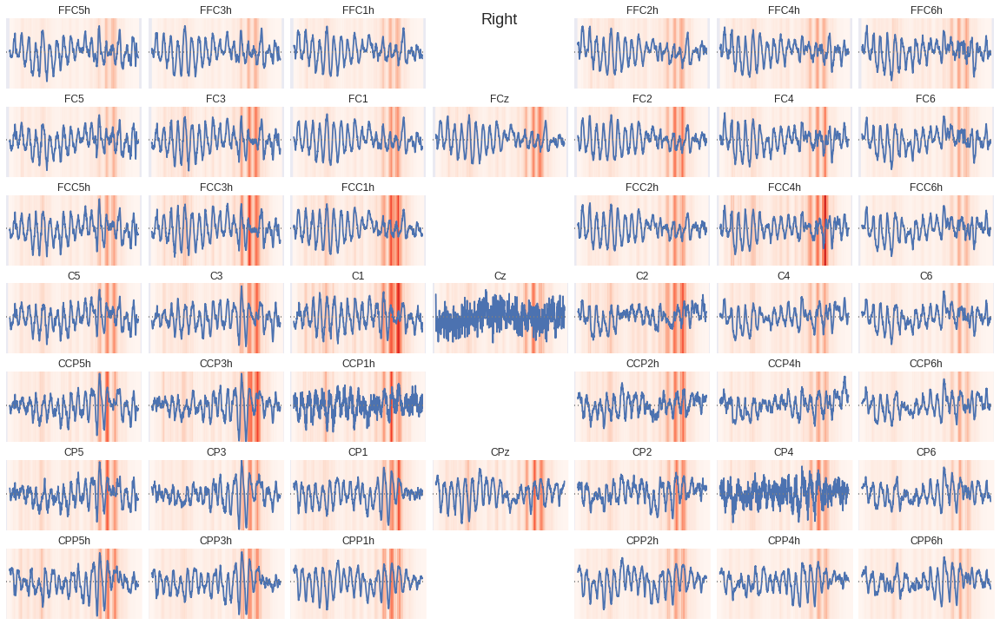

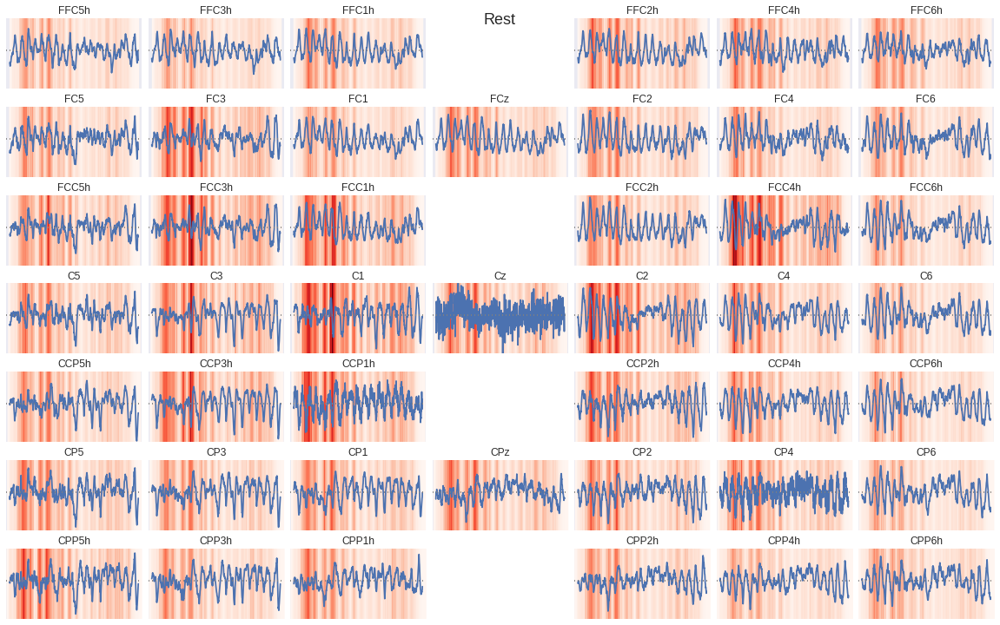

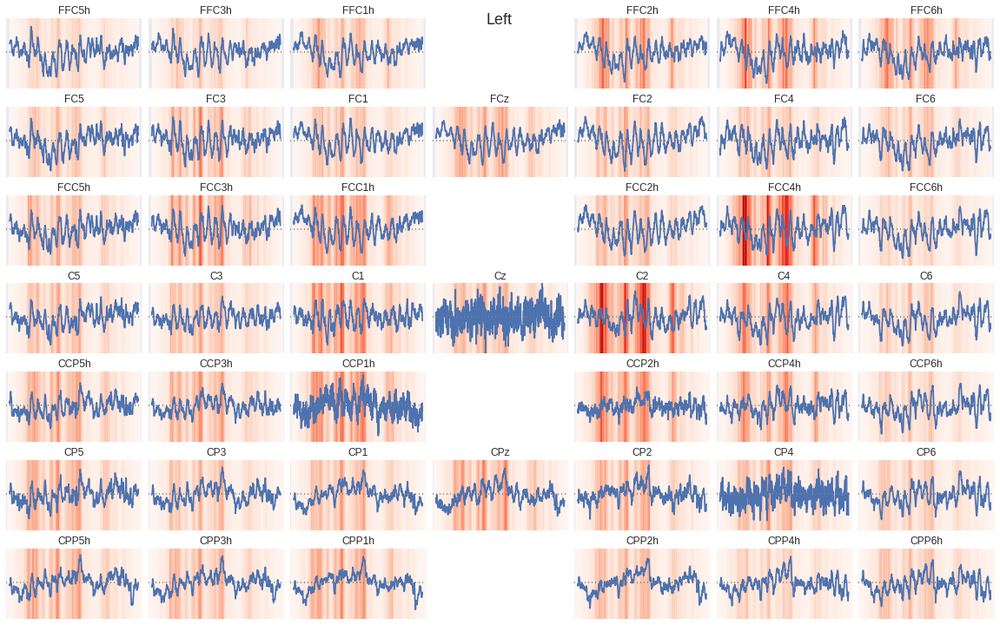

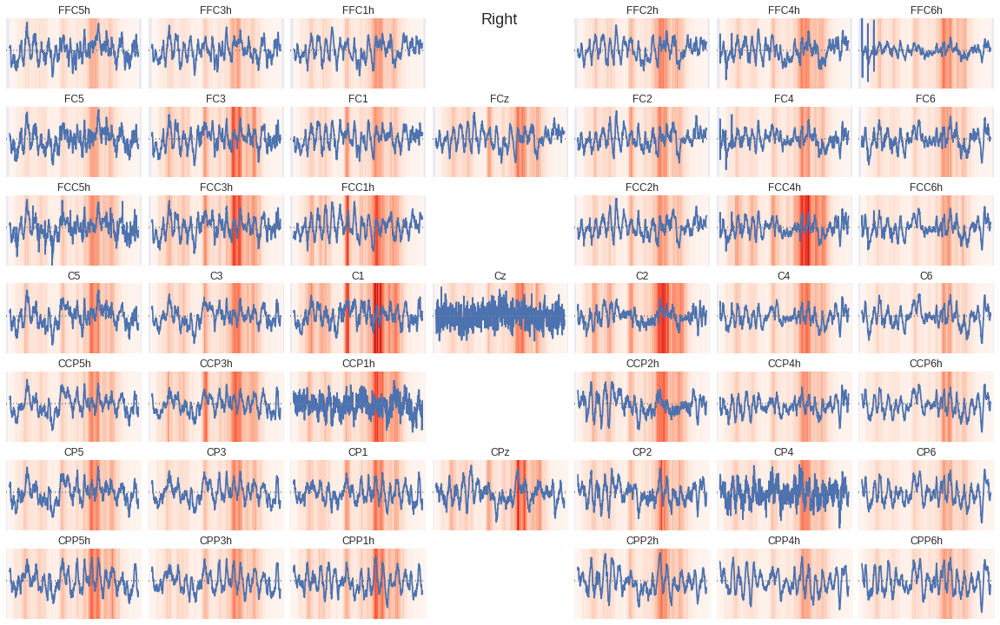

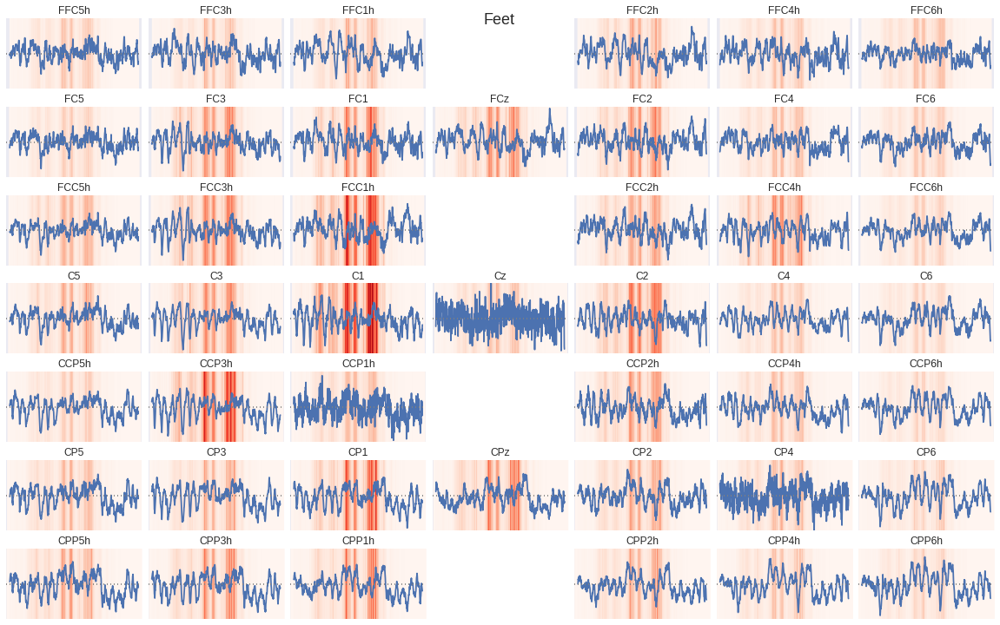

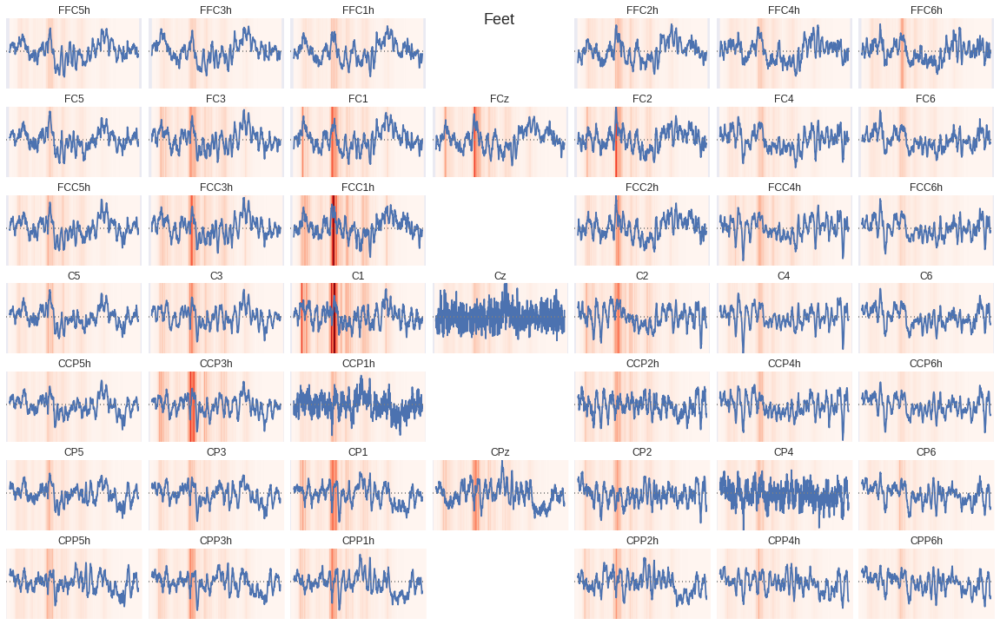

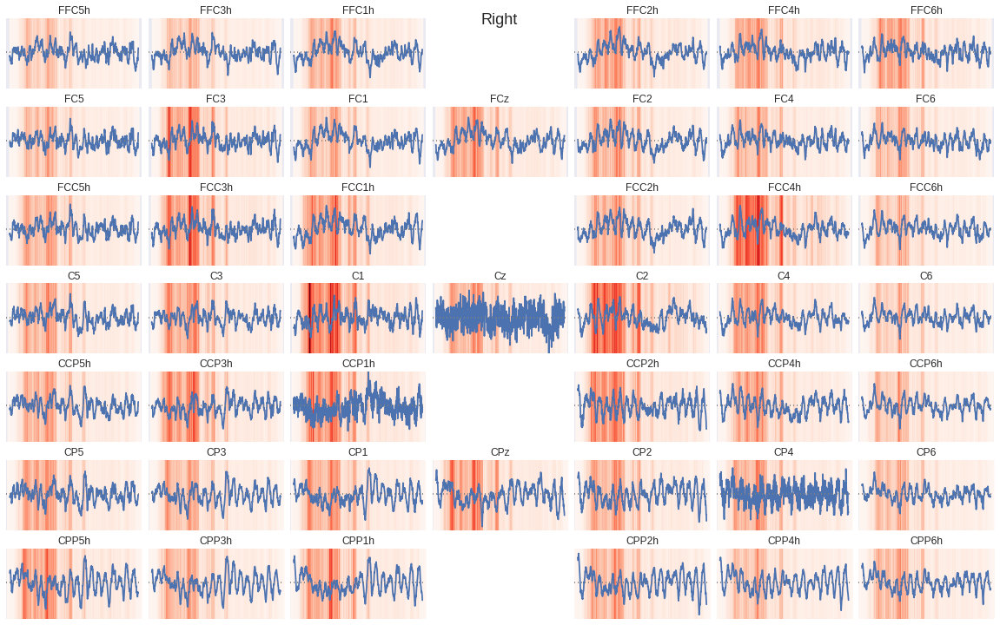

In [67]:
heatmap_fn = create_heatmap_fn(all_layers,rules=['z_b', 'z_plus'], return_all=False,
                              min_in=np.min(topo_trials_end[:10]),
                              max_in=np.max(topo_trials_end[:10]))
class_names = ['Right', 'Left', 'Rest', 'Feet']
for i_trial in xrange(10):
    assert np.argmax(all_outs_per_layer[-1][i_trial]) == trial_ys[i_trial], "only correct trials atm wanted"
    
    out_relevances = np.zeros(4, dtype=np.float32)
    out_relevances[trial_ys[i_trial]] = 1
    relevances = heatmap_fn(out_relevances,topo_trials_end[i_trial])
    fig = plot_heatmap(topo_trials_end[i_trial].squeeze(), relevances,
                                  test_set.sensor_names,
                                  sensor_map=tight_C_positions,
                                  figsize=(16,10))
    fig.suptitle(class_names[trial_ys[i_trial]], fontsize=18)
    plt.tight_layout()
None

### Mixing most relevant parts of trials together

1. Take timeblocks of 100 samples from each trial (of a certain class) from each sensor
2. Determine those blocks with the highest relevance according to the heatmaps
3. Put all of these blocks together to create a new "prototypical" artificial trial for a certain class

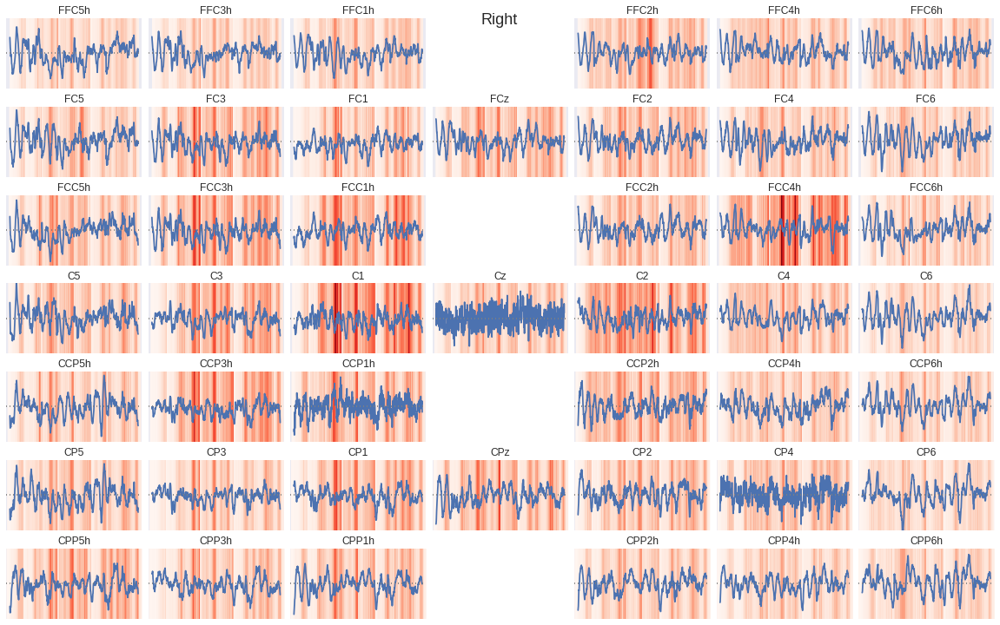

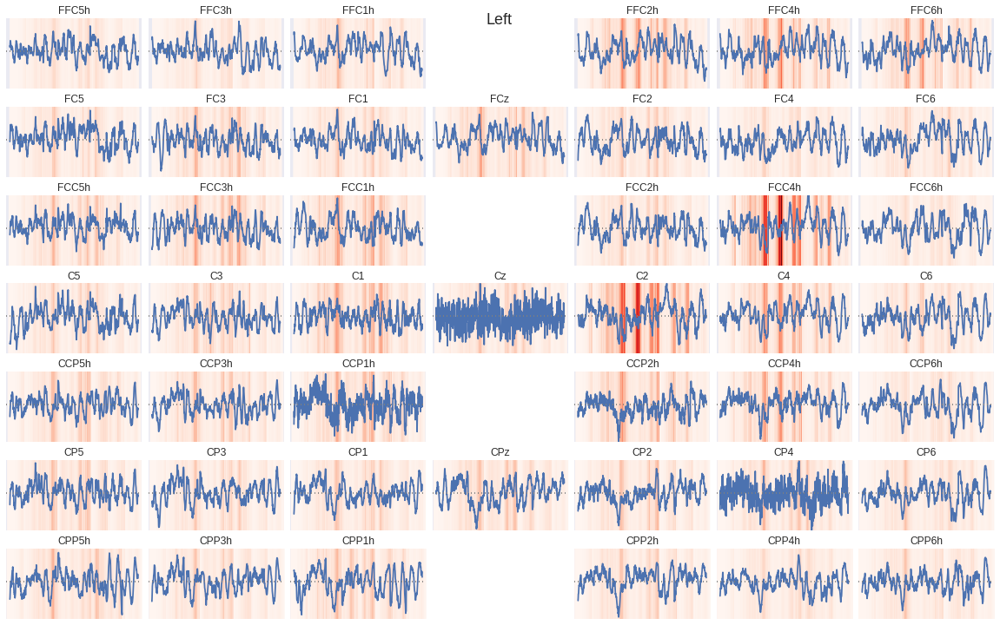

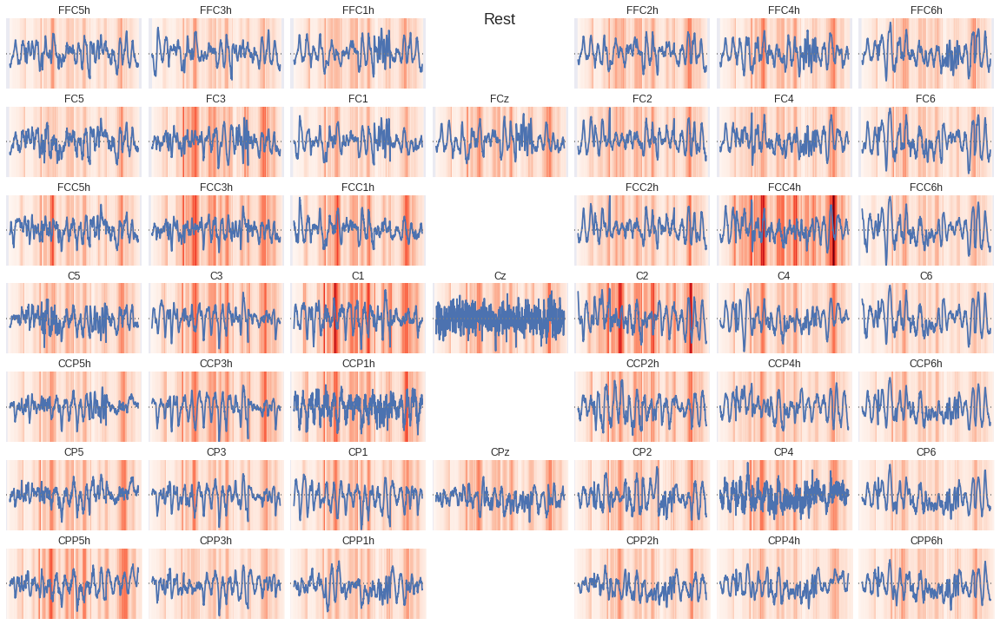

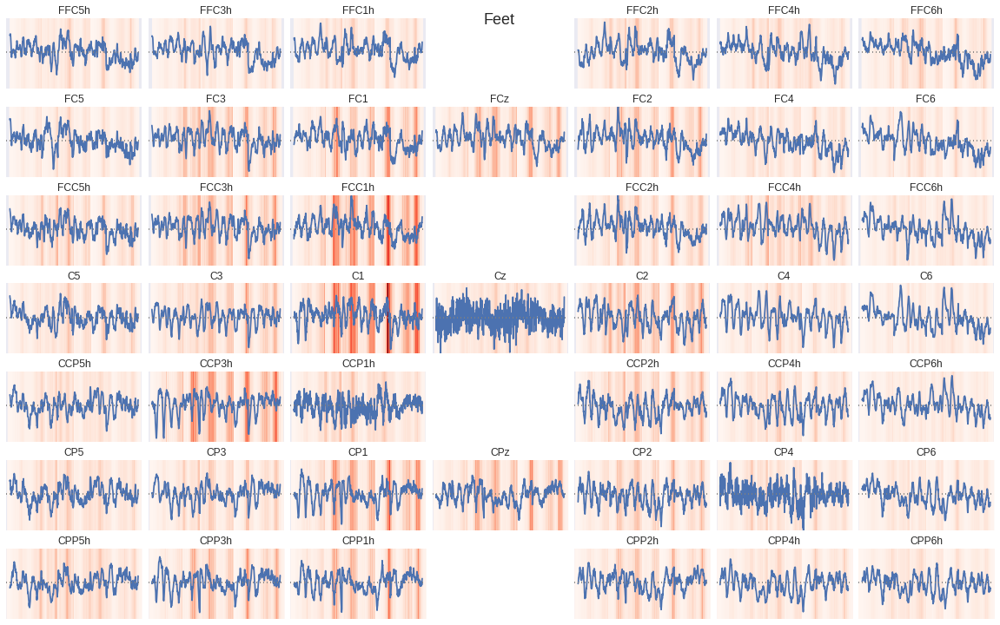

In [74]:
for i_class in range(4):
    perfect_topo = perfect_topos_per_class[i_class]
    perfect_relevances = perfect_relevances_per_class[i_class]
    fig = plot_heatmap(perfect_topo, perfect_relevances,
                              test_set.sensor_names,
                              sensor_map=tight_C_positions,
                              figsize=(16,10))
    fig.suptitle(class_names[i_class], fontsize=18)
    plt.tight_layout()

## Pattern Inversion

Using the patterns to reconstruct the input from the activations. Should ideally allow to see what information the net still retains in deeper layers.

* Maxima of the pooling regions given the input are used.
* Negative input on later layers is removed.

We at least see Cz is being ignored.

There are unfortunately still some problems:

Patterns require covariance for inputs and outputs of every layer, and the way I compute them right now there are maybe not enough samples to get a good estimate. That should be solvable though. A possibly bigger problem is that some units outputs have no activation (dead units) and therefore no covariance leading to some numerical problems (I also need to compute inverse of covariance matrix...) which I don't know how to handle well. Also I don't know how to handle biases.


In [75]:
from braindecode.analysis.patterns import (compute_patterns_for_model,
                                          pattern_deconv,
                                          compute_patterns_for_layers)

In [101]:
from IPython.display import display_html
class_names = ['Right', 'Left', 'Rest', 'Feet']
for i_trial in xrange(10):
    trial_per_layer = np.array([deconved[i_trial] for deconved in normalized])
    fig = plot_head_signals_tight(trial_per_layer[0].squeeze(), test_set.sensor_names, 
                                  sensor_map=tight_C_positions,
                               figsize=(13,10))
    plt.tight_layout()
    titles = ['{:s}: {:s}'.format(class_names[trial_ys[i_trial]], 
                l.__class__.__name__) for l in all_layers[layer_inds]]
    movie = movie_head_signals_tight(fig, trial_per_layer[:6], titles)
    display_html(movie)

<source src="data:video/x-m4v;base64,AAAAIGZ0eXBpc29tAAACAGlzb21pc28yYXZjMW1wNDEAAAAIZnJlZQADM/5tZGF0AAACrQYF//+p
3EXpvebZSLeWLNgg2SPu73gyNjQgLSBjb3JlIDE0NiByMjUzOCAxMjEzOTZjIC0gSC4yNjQvTVBF
Ry00IEFWQyBjb2RlYyAtIENvcHlsZWZ0IDIwMDMtMjAxNSAtIGh0dHA6Ly93d3cudmlkZW9sYW4u
b3JnL3gyNjQuaHRtbCAtIG9wdGlvbnM6IGNhYmFjPTEgcmVmPTMgZGVibG9jaz0xOjA6MCBhbmFs
eXNlPTB4MzoweDExMyBtZT1oZXggc3VibWU9NyBwc3k9MSBwc3lfcmQ9MS4wMDowLjAwIG1peGVk
X3JlZj0xIG1lX3JhbmdlPTE2IGNocm9tYV9tZT0xIHRyZWxsaXM9MSA4eDhkY3Q9MSBjcW09MCBk
ZWFkem9uZT0yMSwxMSBmYXN0X3Bza2lwPTEgY2hyb21hX3FwX29mZnNldD0tMiB0aHJlYWRzPTYg
bG9va2FoZWFkX3RocmVhZHM9MSBzbGljZWRfdGhyZWFkcz0wIG5yPTAgZGVjaW1hdGU9MSBpbnRl
cmxhY2VkPTAgYmx1cmF5X2NvbXBhdD0wIGNvbnN0cmFpbmVkX2ludHJhPTAgYmZyYW1lcz0zIGJf
cHlyYW1pZD0yIGJfYWRhcHQ9MSBiX2JpYXM9MCBkaXJlY3Q9MSB3ZWlnaHRiPTEgb3Blbl9nb3A9
MCB3ZWlnaHRwPTIga2V5aW50PTI1MCBrZXlpbnRfbWluPTEgc2NlbmVjdXQ9NDAgaW50cmFfcmVm
cmVzaD0wIHJjX2xvb2thaGVhZD00MCByYz1jcmYgbWJ0cmVlPTEgY3JmPTIzLjAgcWNvbXA9MC42
MCBxcG1pbj0wIHFwbWF4PTY5IHFwc3RlcD00IGlwX3JhdGlvPTEuNDAgYXE9MToxLjAwAIAAAOJM
ZYiEABX//vfJ78Cm61tbtb+TtX4OmfAUggDmsaP+AxcSMIxfngKONt4Vzcmr+8mgpP+1PqwzvNTM
QPEk8Umqi7hXcdTj8ESGkiwQElDvKPbzpUdcQk3G54tFmhDzrZA4Wl+XUd6bs+OhyQEUDB6yYmrT
JQUbsvkC6vsq2pVPUz+ROuQmisEKuQvivitxQUnvnz7Y4KoyRzadGPSnc6tGxkI/qc87a+QBskGp
sMD4E/YSTZR1k1OOVlFVnTfiHRTTa0kE4PvQvL6UDfSvV8Fiht7qjYirwLgCgNaJqqT2p7t7jMIS
DAaiSb75xOt+X8ZKe7QXOYedyd9gmB6Dqv3LsPgxRfHIAXrqZ/3FGR+X39XjK+OjbiY/5BBTbpL7
jBakmK/ggLtilaB7rGp6CY+i+eyCdRkl41Z+3KWrGVu6w+8zVLl4P/gAu8OoUWJHSkE+zRwNIAWE
DkRlCQEwtjXvDO3FoEer3tCPT9nFoiOJpWo6CeMRKu/8oD0pOjZA4Wl+XT+7rGPIX3n+iHg/gMuv
3XsQfzci2XdHjoLSs11x7y5qKZy8WQrjcNx0EK/3M04gZvb2CnhloMco/4AATdh3HWc+/lx6wqrJ
YG8TkqhO02hqp4x0nNLmKrUs84LbRk83YaOs0QfV+drzfuDzu0UWVIHlw2uWHUNp4UpFXDp2KPCl
iOc8JO7loe/aPq4BtZlSXvW5+w0K434BST82e/BXRNNgCb2okMxCT5zyOHSkpbNnIvbjt8l7kXD9
S1JbAnxe8z2LtTwPcIiNZULeBWVujZVq3bw8daqF/E/yFAiMgJNK7Bu0Djgrdt/NjRU24MgPuWCH
UGLb7F2lAzzqQzlhGJymgbM3/qcHnBtkiRr29wutlYn54bE5wy43vNXFpBnNrRX/2bovDiE5v+yO
e2SGuFQNL11ngYWffTETn+uamJsVUZI/xybR6nr0Zj3e2FgUSZXuKovsuUK2/YlTuC5Lez6RlUEl
I6QCp4X+ML0JVnyqLAyda52fr4LA9ZsvLm1QjEUhgMjjGjl9IQ52fPnifd/9EF/evg7dOsCgAi7H
LNhdTkchBYy4x5VDI/heaWG87Fxw9aTjthvtjrA1oB1nehL1/7xzp6UAB3jDyupRkvKWkT/w7IDf
9h9h3gMDRwe1wHiRJQ2SCk0YGeXCHixCm+1z4WsikDf/UrmJWMlUiX+fxlK1MyfjY4uExKh6yX0N
mi2t9QsoHK3brnoAgWvk0z7zoL3//GMXTmQ2fcKABD31cpTskaAdteDackArUBVzOojjyDSTzWCn
yBptCf+Lsnrq0DfHI6nnQctc6yz6n8mSGDkVjAwPbjqUk5YHkTVfl369SCHg/PlNMl9kXzO+tau3
etZNDZcDgwCAdtvRcu5BDJ1k2QYu7zC8CIUMp+WpEpt1oayfSt8EuBRJl3///R2ch01E8NZrfnnH
b2K5eLMuUmo40HbHLfyoN8Bw//p/WkoeFhykPHi6lzpFfOEI3Wp9tSP85vjX/yWjCJCZl0slnfjp
H1RCAKrTSmXGNuBYgW/Tu6JQsGvsUo9/y2GOLIXao663YEKt2bqwauCdOu87wY1JzqnctfHnJnlB
sUHYIDBBSeo4P3hUm++Q2n41UgWQGTgqgPooaYtl+NWypReLDTXFJB+CTSxIR5pmqk1L9ZnV5P8Q
9KPDRzKKQxrVrqnJA2CZmrh34mrY7vvrzwNr336WxFyvBMgjYrBBS7YU6k7NV6thafl7AQfju9+k
LWOtkBX+wqGae9Sts/dvl29GsulKq3unO2kRI3+uwUuYMhphRGh9o90pftsTVoA4GjGTK3oOK6fh
04j5J1YbOyg1neG5yyoc3KuRLuCyi4z0TL14Iivzjsz4i534eSAJdep8a8c/M5qHur5vTU837RGN
tWneJQm/U61jcOgDW+Rp3lM5uhjnM+9sshgZckbup5ZNZpB9JKM3+kEbVqah6kqDBzYlLBgGQYo4
A0gsDw9b5PlE90ObMSEc8u740kakmyiaADaYZz+LiBJjtB+VRSIb2NDrnWgKq06TtuG5GvaKNglB
uPd0iAy0YzuYDleNqyTe8eR7wpPLSKYSiL0DaPWqkk2+Mxo3STngQY7TCjCHXRSE5JD0EJVeTi1q
6tuFqs4rB7Tlrvm+xSMUAMHuu/S82Gvu5JsO4UUAl11F9ftBOq3batvo/7gILju2R6Ynjo6/K97d
sXCuxrwzo6SEfS9Rip3Tl21C+mhX7rcNC7iTO1g4Wzr0aHMaSYFV3mFH/iYT+Dqgtf2ecmx2duTI
tFYJKu0m/8f4jREaAD13gEAr+ClqYS+dIvoK9CsmADWsPHtxk/9jQy2jGemX1SwiqFXm53CXBMhM
nNj++XU8pU/5XmSUuaKUHm8FQBrzNYQrPObjucso9/AmUW5IgsMo5DuWU/SQF1+YDlPclnRBP44c
7qkwQ+jPXc6t3NxAQLBpNp2nhXxP58w9+hRRs0Sy1lgUHJPuDToKQuG3Dx4SBCwnwZRmBsmsIQU3
f5jqJB/aD5V+tVkQmL+Xuawr0AMqaJ/7Q1HvJ1SwV0O3/P9FzrD3+mg4WhK4//v30sA/aohtHmbZ
Lsl3foPxQJFh2YPdYkIxFLqGAU6O3Iv6VsS/8spRrEnrGFpGxPZGP++7IIYr4AWRG44gA8YYiUZD
Ce4l48/19YmnwlfgNuhxje9vqRsIer9W1gKUIQ/8/CjNgAAoC0PLHX1tTRqiF813D/UwKhvVNu3T
P9Xs1DgSxLQTFSNVvWezeT6k2P1yPzUf0RpysxDKF3SNX4+L1JJNChaqy7HmKRpwBgsAskXfbzjy
LuyaJUf9fXoF/ha4wXbcsqABJjfzL7YhWaAsBSGdtkTRgiQNjciaOWGz09fcaPNtlqyHvYojFpdn
vsk32nUtEQN9dxv5BPGwzqAMJvsJkM4AOZBb

<source src="data:video/x-m4v;base64,AAAAIGZ0eXBpc29tAAACAGlzb21pc28yYXZjMW1wNDEAAAAIZnJlZQAGL2xtZGF0AAACrQYF//+p
3EXpvebZSLeWLNgg2SPu73gyNjQgLSBjb3JlIDE0NiByMjUzOCAxMjEzOTZjIC0gSC4yNjQvTVBF
Ry00IEFWQyBjb2RlYyAtIENvcHlsZWZ0IDIwMDMtMjAxNSAtIGh0dHA6Ly93d3cudmlkZW9sYW4u
b3JnL3gyNjQuaHRtbCAtIG9wdGlvbnM6IGNhYmFjPTEgcmVmPTMgZGVibG9jaz0xOjA6MCBhbmFs
eXNlPTB4MzoweDExMyBtZT1oZXggc3VibWU9NyBwc3k9MSBwc3lfcmQ9MS4wMDowLjAwIG1peGVk
X3JlZj0xIG1lX3JhbmdlPTE2IGNocm9tYV9tZT0xIHRyZWxsaXM9MSA4eDhkY3Q9MSBjcW09MCBk
ZWFkem9uZT0yMSwxMSBmYXN0X3Bza2lwPTEgY2hyb21hX3FwX29mZnNldD0tMiB0aHJlYWRzPTYg
bG9va2FoZWFkX3RocmVhZHM9MSBzbGljZWRfdGhyZWFkcz0wIG5yPTAgZGVjaW1hdGU9MSBpbnRl
cmxhY2VkPTAgYmx1cmF5X2NvbXBhdD0wIGNvbnN0cmFpbmVkX2ludHJhPTAgYmZyYW1lcz0zIGJf
cHlyYW1pZD0yIGJfYWRhcHQ9MSBiX2JpYXM9MCBkaXJlY3Q9MSB3ZWlnaHRiPTEgb3Blbl9nb3A9
MCB3ZWlnaHRwPTIga2V5aW50PTI1MCBrZXlpbnRfbWluPTEgc2NlbmVjdXQ9NDAgaW50cmFfcmVm
cmVzaD0wIHJjX2xvb2thaGVhZD00MCByYz1jcmYgbWJ0cmVlPTEgY3JmPTIzLjAgcWNvbXA9MC42
MCBxcG1pbj0wIHFwbWF4PTY5IHFwc3RlcD00IGlwX3JhdGlvPTEuNDAgYXE9MToxLjAwAIAAAciL
ZYiEABf//vfUt8yy7VNvtguo6J9RpYna8wBGcGG1mXYmQbxGUGLXlXj7fyffD0XUOsDqn2Y6XozZ
2rFQ62hpb4kyIHwr8adG3JwQElDvKPdDtjOtok3G5+Fj6hajrZA4Wl+XUeNTyaNbECbWn9HtpDCX
eACTPrOi6vsq2pVPfoXwsOQmisEKuQvi2OIrVLUFDz7Y4Ko161grnU2budWjdEfXRKe0KDea65aN
E1u/3/sJJso6yanRX2Qynjs1DopptaSC2mCKq5diNAFhkEBYobe6o2Iq8C4An6Wiaqk9qe7e4zCE
T0Gokm++cTrfl/GSn+0FzmHncnfYJgehoqwAstkQCFvVPdVe+/9xRkf5q9jHrl7rA0TH/IIpVrEE
zFMjVvXosFcNHfsHusanoJj6L57IJ1aSXjVn7cpasZW7rL8XNUueaX98+SrcWJJWKQou4JtSNNYG
9RBISAmFsa93924tAj1e9oR6fnyp/SqZVWHQTxiJV3/k4ulJ0bIHC0vy6f3dix5C+8/0Q7r7x/BX
YrDcSFtWy7o8dBaVmuuPccJ5VDBaFL/x199ehX+5mnEDN7ewU8dchjlH/AACbsQiGOk3TbdWFVZL
A3sclUJ2m0NVPGOk5n9fLalnnDryMnm7DR1miD6xzteb9wed2iiypA8t21yw6htPClIq4dexGd4p
hznhJ3ctD3pcDPANrMqS963P2KhXG/AKT/mz34K6JpsATe1EhijSfOeRw6UlLZs5F5cdvkvci4fq
WpLYJcb3mexdqeB7hEOoZ8a/v8r3siO4B0s+TaQv4n+QoERkBJpLYN2gccFbtv5saKm3BkG+hv6c
5GN4nR5WRHL4tMC8QHyuaBszf+pwecG2HZGvb3C62VifnhsTnDLTZC72QPGnwQ6P/Zui+4WbaP3f
kWyQvjwxpeus8DCz76WCc/1zUxNiqjJH/tbGZE9ejMe72wtfiTK9xVF9lyhmH7EqdwXJb2fSMqgk
pHSgVPC/wBehKs+VRYGTrXO0FfBYHrNl5c2qEYikL90sg0cvpCHOz588T7w/ogv718HsnzgSAEXY
5ZsLqcjYILGXGPKoZH8LzSxRnYuOHrScdsN9sdYGtAOs70Jev/eOdPSgAO8YeV1KJl5S0if+HZAb
/sPsPMBgaOD2uA8SJKGyQT5hlXqQEMg6nKghkOAjygb/6lcxKxkqkS/z+MhWpmT8bHFwmJUPWS+j
s0WdhVC8e8rduuegCBa+TTPvOjfllvXDVReytgyv3AKavaSK/uW2Ug8cSOSgV5yhtOMK9t2PcLRM
0bqXIaOqHnVl76Sfr6wJUoaHObVJSRM+P+AWL0Xn4ji/C9NwkyWSVBvwF+TTEMYczP4AV6be8ZOz
esUCHIW3oz0H3jQoKg8c9U9b4uFbnS9Oz9B2slCWrc7w8L79OeKOn8a3gB6K0G2r32u98DMaVesw
nT8Rly9WYGXg3sHauCr6zTyUd9CZxFhuaf//bChUr81N5YlsafyuOGVoLBLjqmXgfBHMEvrA3WJh
xehVENjVd2q1zXxSRKZKnAaUP7BSxt/DPqC/+zRdPWeBr1cokIf4g8dZ2vTYfOQhQIFlT2OdKzhh
OFtjXvf9YIy49sfiqwqYOQq3ZurBq4J08wHg7HyXRHAqSRTnpifUGvdggMEFJ6jg/eFZsp8htPxq
pAsgMnJE+NtOy7iI8LF5iibpTNcUkH4JNLEhHmmJaGLb7ibl1cdtIthz33wITLZI5DEboTmpTSGB
xH4jSUF7zwNr336WxOFBBMgjYrBBS7YU6m7NV6thafl7AQfju/+3WiL+3BX+wqGae9Sts/dvluWD
KUDLbtkr16EJ5H/XYKXMGQ0iM6f/qC0siljnNBV8OlPJiHP7LNsoAYGck6sNR/kHx+OlWqYDA7zP
d+Kb3PqTqck73EwRqELzuOM4R1htm6av38c/M5qHuj5vTU837RGNtWneJMm/U61jcOgDW+Rp3lNZ
m/yo0hdzoS/l5I8BbMNnPBnzrJuiNSYaQvZrLfdTsVd11/rwJugGIS1sDw9b5Pk/XJhO8SEc8u74
0kacWyiaADbYZz+LiBJjtCifi/fAweCiuq3wZQSfbcNyNe0UbBKDg+7fEBloxncwHK8beEm948j3
hSeWkUwk/XoG0etVJJt8ZjRukZPAgx2mFGEOuikJx+nnFpmUNQzvP7ZTP9FRiFEcYCL8txhGO/mJ
qaz3pitu5JrxQhEBL5qL6/aC7tYPGImMvySWGVYJHqxeOjr8r3t2xcK8XPDOjpIR8L1GKndOXbUL
6Zxfutw0LuJM7WDhbOvRUcxpJgVXeYUf+JhP3/HKu4KZ3BTZU5Mi0Vf9gjfhDzuCVcUBMycn7g6o
7jh6/XzpF9BXoVkwAa1iIGT2D/ppqW0Yz0zdicGKoVfyYNaekJUM26nTJCGLhD/TAl01ZZX2x7ta
AGvM1hCs85uO5yyj38CZRbkiCwzvberZT9JAXX5gK09yWdEE/jhzuqTCn6M9dzq3c3EBAsGkMnae
FfE/nzD36FFG3RLLWWBQck+4NOgpC3cLWgY4LOvkgLBJrEYOGxw4FKyOt+zYnhMnKhFUQVZe57so
c6ypon/tDUe8nVLBXQ8f8/0XtmMy1DYJC/3j//Rz9tUNqqPizZ/CJ/oA/6/gPt9tNgCyhLnZBanJ
NWUvySoEZTX/BBa2rVvKEYiquQQ0/upbkX9Jr8f+WUo1YjYtt9cSVW1qYPt36Qn6BV/vYK/kA+BH
Xjzn38iNKWNHJ4XTp4LTF/BrfNJzEeb5J2mPr8/19b7P0RsZ27D6RUQM6kbCHq/VtcG0kU9BzwWu
uU7KIvufJv4lz4oea5e48vtFVlmZVn/rTWWL+DZUkNeSv/7P7IzYp5hq6LT/mBw/CRU4FDhR4Ee6
TlNyIs3AlcrFx+ssUwL7J/YeUbqQwLwlFiVv

<source src="data:video/x-m4v;base64,AAAAIGZ0eXBpc29tAAACAGlzb21pc28yYXZjMW1wNDEAAAAIZnJlZQAGGuVtZGF0AAACrQYF//+p
3EXpvebZSLeWLNgg2SPu73gyNjQgLSBjb3JlIDE0NiByMjUzOCAxMjEzOTZjIC0gSC4yNjQvTVBF
Ry00IEFWQyBjb2RlYyAtIENvcHlsZWZ0IDIwMDMtMjAxNSAtIGh0dHA6Ly93d3cudmlkZW9sYW4u
b3JnL3gyNjQuaHRtbCAtIG9wdGlvbnM6IGNhYmFjPTEgcmVmPTMgZGVibG9jaz0xOjA6MCBhbmFs
eXNlPTB4MzoweDExMyBtZT1oZXggc3VibWU9NyBwc3k9MSBwc3lfcmQ9MS4wMDowLjAwIG1peGVk
X3JlZj0xIG1lX3JhbmdlPTE2IGNocm9tYV9tZT0xIHRyZWxsaXM9MSA4eDhkY3Q9MSBjcW09MCBk
ZWFkem9uZT0yMSwxMSBmYXN0X3Bza2lwPTEgY2hyb21hX3FwX29mZnNldD0tMiB0aHJlYWRzPTYg
bG9va2FoZWFkX3RocmVhZHM9MSBzbGljZWRfdGhyZWFkcz0wIG5yPTAgZGVjaW1hdGU9MSBpbnRl
cmxhY2VkPTAgYmx1cmF5X2NvbXBhdD0wIGNvbnN0cmFpbmVkX2ludHJhPTAgYmZyYW1lcz0zIGJf
cHlyYW1pZD0yIGJfYWRhcHQ9MSBiX2JpYXM9MCBkaXJlY3Q9MSB3ZWlnaHRiPTEgb3Blbl9nb3A9
MCB3ZWlnaHRwPTIga2V5aW50PTI1MCBrZXlpbnRfbWluPTEgc2NlbmVjdXQ9NDAgaW50cmFfcmVm
cmVzaD0wIHJjX2xvb2thaGVhZD00MCByYz1jcmYgbWJ0cmVlPTEgY3JmPTIzLjAgcWNvbXA9MC42
MCBxcG1pbj0wIHFwbWF4PTY5IHFwc3RlcD00IGlwX3JhdGlvPTEuNDAgYXE9MToxLjAwAIAAAb81
ZYiEABX//vfJ78Cm61tbtb+TtX4OmfAUggDmsaP+AxcSMIxfngKONt4Vzcmr+8mgpP+1PqwzvNTM
QPEk8Umqi7hXcdTj8ESGkiwQElDvKPbzpUdcQk3G54tFmhDzrZA4Wl+XUd6bs+OhyQEUDB6yYmrT
JQUbsvkC6vsq2pVPUz+ROuQmisEKuQvivitxQUnvnz7Y4KoyRzadGPSnc6tGxkI/qc87a+QBskGp
sMD4E/YSTZR1k1OOVlFVnTfiHRTTa0kE4PvQvL6UDfSvV8Fiht7qjYirwLgCgNaJqqT2p7t7jMIS
DAaiSb75xOt+X8ZKe7QXOYedyd9gmB6Dqv3LsPgxRfHIAXrqZ/3FGR+X39XjK+OjbiY/5BBTbpL7
jBakmK/ggLtilaB7rGp6CY+i+eyCdRkl41Z+3KWrGVu6w+8zUK8/4E/mN5S/PiZ3Gq/gaQAsIHIj
KEgJhbGveGduLQI9XvaEen7OLREcTStR0E8YiVd/5QHpSdGyBwtL8un93WMeQvvP9EQQBTqLwGHv
2Is4Eo5dHjoLSs11x7y5qKZy8WQrjcNx0EK/3M04gZvb2CnhloMco/4AATdh3HWc+/lx6wqrJYG8
TkqhO02hqp4x0nNLmKrUs84LbRk83YaOs0QfV+drzfuDzu0UWVIHlw2uWHUNp4UpFXDp2KPCliOc
8JO7loe/aPq4BtZlSXvW597s57fLqufzZ78FdE02AJvaiQzEJPnPI4dKSls2ci9uO3yXuRcP1LUl
sCfF7zPYu1PA9wiI1lQt4FZW6NlWrdvDx1qoX8T/IUCIyAk0rsG7QOOCt2382NFTbgyA+5YIMzuU
SwTg/t5Yi3Z00GtLxHZkP1iqWaNAXnXY/L3jRQuSwOP/6TjlPmCopVszu0CNf/xEsuDvz+Y8CBxE
Q9wwynWqab2SDaapf0ChL7WmXPg5BbtiM10Q5pcT7umUUzV3ttv1KvBx0oYRLTlSD0mIddJUhJI+
SQj1cqPb8sGBnPWRLzhRa/bH13JuKRW02OMh80hr4EAuEM0vMTYhdvg8qp1w2MIj5j6qFrwcdjej
zMVGh0OPML3WHvz6Jip8Xxd2DNMRDgJc7qHZebEoSwpEAB1FjT0+rSBEYACgICvR1FtkKCECa6qH
7MIJYw2MG6Ln9Bl2te9hxIGBV8AMotbnWhpma/g/3SLuWht0TfY9N1zUflGa4qJPxvePwo/BJx+2
L8OhjpmzZw8ZC6do6ISVkIWdM63hdr9WmpW8yPIrjg3qgtiYZ8OhjoeXwv0H29PzwqufDNPz9FIU
UhK5Ry2n03lsaZteqkxUnm4PhJpf0YWeOTAMeTthhfr+0GuseF3vi9VbH2ZaGoORRleTlPABpl5d
isLuf11kn7dJGaxNJVcoHSmTNOk2e5v4v//5rjDbTbEPIe779x29iuYu+zYshhn7NWRQpvn+CNbY
nTWV2DaSlofVsyNyOmUMyYeTInLlEPfkTf//I5lkPO2cfK+JAaxVNvQLVTBglDGkYbOn4x3dEoWD
X2KOS/6E6UIA//STCpg5Crdm6sGrgnRLCcEl/JdEcCpJFOemJ9QZGeCAwQUnqOD94VqzZ5DafjVS
BZAZNSJ8badl3ER4WLzFEp4dvlFo3i/QAhuxZe/JXm33G7rkkHj0o8NHMopAWtWuqckDYJmauHfM
QxGkoL3ngbXvv0th5NkqSCNisEFLthTqTs1Xq2Fp+XsBB+O6P7VmIwBdzkZhUM096lbZ+7eVK5gU
flBx0YGSp2vbQilQ0AP/v6f/qC0siljnNBV8OxjP/oor1dPw4aT8k6sNTfkFneG5yyoc3KuRVE4b
SsUnU5JXuJgjUIXnccZwkxDbN01fv45+ZzUPaWnemp5v2iMbatO8SbN+p1rG4dAGt8jTvKR0tfbQ
IFvnbAAy5I3cfyyazSD6SUZv9II2Yrpa1JUGDmxKWDAHQA/jTxUstV9SED1oF0ObMSEc8u740kaW
myiaAFWchP9Rsl28r6syNEQ3saHXOtAVVZ0nbcNyNe0UbBKDg63c6UvORncwHK8bXkm948j3hSeW
kUwk6nc+dnMzu1gyWyS/gbWBBjtMKMIddFITjN/TTai5FTdNmBO+qzisHtOWu+b7FIxPAwe679Lz
Ya+7kOnLznOfCM25d816yQuavOkB+MHbm2Jz1aeDldfcjW8SFhr5PdOmKL4wKoFhpg5yiF53HGfM
4wAxqzJykfCQ9r7dBcL+OvMjHR89HeTLNS/f9vYj3rAb67cIX4ND6/LK+cLxGP9RrQdQ6+glsjyd
loOCt75W2omq1mtM0ka2KjlBQDPx9JGqei7yL9jDKP4LiL1+tLV0ufxmnXQEZF/Twf/Bu7kVaH+t
Qvl/hsulbtUv66gscGCJWYf6tRVNhUyNk5vCPvtwgh9Fy3N8r/xQmG++2gAcby7XvcJMN5vD3A7Q
PR0QwIF0nE0BwtxOXITfUfJpM5GU8+kjq9SgqBd8fS6JCf6Y/fexsH9lCFXAS3yW8/5S8ZCPbwI5
yoxIXnsy6qFK505VGjVs24wPD24MMxhX8Y+nv/+shw+SMCwXU7qaJdlOWN+jYVa98cCsnWSRFyn7
6TQ7D+Y5kyd26zX/1k/0aCUWNgIqw9kY/77sghivgCH4L/xd+ww1ejyyGz1+73GNf9usTT4SvwG2
/nL0mz+jHkDtXSxUA9LrD/z8LCIwUfAL5THeThxAEGxh7aLosAKGjHz1Zz6+X1R809PJqu8WyHq9
ahrJvMqjCHsriJMPv2qGfEqDZ/9Zcj1BMUlYe3nUbjqwKVLdk8tcod2ZSfMMbEhPu78ODuuNyczn
1erg9MQMMY8nDqM/5vGIcR+auW6TGXI6RR3Lr2gLpiCHN0VWlLzos0p423zCPVkm7rxNltzV5edn
QW7kxwONb4jTNNqUVVahZAojC0rp0mb7n27a

<source src="data:video/x-m4v;base64,AAAAIGZ0eXBpc29tAAACAGlzb21pc28yYXZjMW1wNDEAAAAIZnJlZQAFZ4ptZGF0AAACrQYF//+p
3EXpvebZSLeWLNgg2SPu73gyNjQgLSBjb3JlIDE0NiByMjUzOCAxMjEzOTZjIC0gSC4yNjQvTVBF
Ry00IEFWQyBjb2RlYyAtIENvcHlsZWZ0IDIwMDMtMjAxNSAtIGh0dHA6Ly93d3cudmlkZW9sYW4u
b3JnL3gyNjQuaHRtbCAtIG9wdGlvbnM6IGNhYmFjPTEgcmVmPTMgZGVibG9jaz0xOjA6MCBhbmFs
eXNlPTB4MzoweDExMyBtZT1oZXggc3VibWU9NyBwc3k9MSBwc3lfcmQ9MS4wMDowLjAwIG1peGVk
X3JlZj0xIG1lX3JhbmdlPTE2IGNocm9tYV9tZT0xIHRyZWxsaXM9MSA4eDhkY3Q9MSBjcW09MCBk
ZWFkem9uZT0yMSwxMSBmYXN0X3Bza2lwPTEgY2hyb21hX3FwX29mZnNldD0tMiB0aHJlYWRzPTYg
bG9va2FoZWFkX3RocmVhZHM9MSBzbGljZWRfdGhyZWFkcz0wIG5yPTAgZGVjaW1hdGU9MSBpbnRl
cmxhY2VkPTAgYmx1cmF5X2NvbXBhdD0wIGNvbnN0cmFpbmVkX2ludHJhPTAgYmZyYW1lcz0zIGJf
cHlyYW1pZD0yIGJfYWRhcHQ9MSBiX2JpYXM9MCBkaXJlY3Q9MSB3ZWlnaHRiPTEgb3Blbl9nb3A9
MCB3ZWlnaHRwPTIga2V5aW50PTI1MCBrZXlpbnRfbWluPTEgc2NlbmVjdXQ9NDAgaW50cmFfcmVm
cmVzaD0wIHJjX2xvb2thaGVhZD00MCByYz1jcmYgbWJ0cmVlPTEgY3JmPTIzLjAgcWNvbXA9MC42
MCBxcG1pbj0wIHFwbWF4PTY5IHFwc3RlcD00IGlwX3JhdGlvPTEuNDAgYXE9MToxLjAwAIAAAZu1
ZYiEABX//vfJ78Cm61tbtb+TtX4OmfAUggDmsaP+AxcSMIxfngKONt4Vzcmr+8mgpP+1PqwzvNTM
QPEk8Umqi7hXcdTj8ESGkiwQElDvKPbzpUdcQk3G54tFmhDzrZA4Wl+XUd6bs+OhyQEUDB6yYmrT
JQUbsvkC6vsq2pVPUz+ROuQmisEKuQvivitxQUnvnz7Y4KoyRzadGPSnc6tGxkI/qc87a+QBskGp
sMD4E/YSTZR1k1OOVlFVnTfiHRTTa0kE4PvQvL6UDfSvV8Fiht7qjYirwLgCgNaJqqT2p7t7jMIS
DAaiSb75xOt+X8ZKe7QXOYedyd9gmB6Dqv3LsPgxRfHIAXrqZ/3FGR+X39XjK+OjbiY/5BBTbpL7
jBakmK/ggLtilaB7rGp6CY+i+eyCdRkl41Z+3KWrGVu6w+8zUK8/4E/mN5S/PiZ3Gq/gaQAsIHIj
KEgJhbGveGduLQI9XvaEen7OLREcTStR0E8YiVd/5QHpSdGyBwtL8un93WMeQvvP9EQQBTqLwGHv
2Is4Eo5dHjoLSs11x7y5qKZy8WQrjcNx0EK/3M04gZvb2CnhloMco/4AATdh3HWc+/lx6wqrJYG8
TkqhO02hqp4x0nNLmKrUs84LbRk83YaOs0QfV+drzfuDzu0UWVIHlw2uWHUNp4UpFXDp2KPCliOc
8JO7loe/aPq4BtZlSXvW597s57fLqufzZ78FdE02AJvaiQzEJPnPI4dKSls2ci9uO3yXuRcP1LUl
sCfF7zPYu1PA9wiI1lQt4FZW6NlWrdvDx1qoX8T/IUCIyAk0rsG7QOOCt2382NFTbgyA+5YIMzuU
SwTg/t5Yi3Z00GtLxHZkP1iqWaNAXnXY/L3jRQuSwOP/6TjlPmCopVszu0CNf/xEsuDvz+Y8CBxE
Q9wwynWqab2SDaapf0ChL7WmXPg5BbtiM10Q5pcT7umUUzV3ttv1KvBx0oYRLTlSD0mIddJUhJI+
SQj1cqPb8sGBnPWRLzhRa/bH13JuKRW02OMh80hr4EAuEM0vMTYhdvg8qp1w2MIj5j6qFrwcdjej
zMVGh0OPML3WHvz6Jip8Xxd2DNMRDgJc7qHZebEoSwpEAB1FjT0+rSBEYACgICvR1FtkKCECa6qH
7MIJYw2MG6Ln9Bl2te9hxIGBV8AMotbnWhpma/g/3SLuWht0TfY9N1zUflGa4qJPxvePwo/BJx+2
MAX+xHqfTDrvjIElmk7Ou5EX6nf/zw/KhWdOLOTVGlZY6QaOc5enBaA5F2h3EFhq8NexpSQ9/e5w
Xgfukef2s5jP6x3hSnWB7oxNxYRLM4adJxr/txmGywx/B2Rzbd8suu5hmjCaK/xFNb2vNnMJZtn5
Bxp0lM0jSVpFe3E12PYyNMDE/jZGfSf95M7pQcyUQYArOtji/uNv0SQ/vJ1sYbHPc8v8Agu3jAtl
9T1OXjObVRWXYiXQy4zPHSJ5Ok2vtaPOv/9q1M3IJ0qbPFv2teoSIzmwRj3L+NB2xy37tffaGbM6
U1ldg2kpaN5uU7WqpAHCxRy9US0K307F9v+XE3Hl+Culks78dI+qHvzVaaUy4xtwKuOH6d3RKFg1
9ijuf6lt4RByT1Jut2BCrdm6sGrgnRbRNL6T/DTiLqna/9aw0XEn7BAYIKT1HB+8KgkbJDafjVSB
ZAZLK4IXWmbnN5p0rD2ICCma4pIPwSaWJCPNMn0UNvuNWdInbSLYc998CEca1a6pyQNgmZq4d6xq
2O77688Da99+lsQAvlSQRsVggpdsKdRdmq9WwtPy9gIPx3R/h/Iixl3ORmFQzT3qVtn7t56+KyKB
vzf+7GRI3+uwUuYMhpEG0//UFpZFLHOaCr4dKO7pKQTRkKNZaT8k6sNTnjVneG5yyoc3KuRUlC6i
4z0TL18Iivzjsz4i534W/9tm6av38c/M5qHrG+b54yYNIH4kUR6eLMNNMZ0dDyVKenLE1GL5g7I6
u2UmYFHdMsB8TxZzwZ86ybojUmGcUYWtSVBg5sSlgv/UAP408VLLVfUhA9bCIgT5d2CGV+xEOrf4
BIkwBgX3s/UbJdvK+gm/REN7Gh1zrQFVPdJ23DcjXtFGwSg4/ojulLzkZ3MByvGxKxvePI94Unlp
FMJHkANBeFWkk2+Mxo3R9ngQY7TCjCHXRSE4vDwkSq8nFrV1bcfVZxWD2nLXfN9ikYn4YPdd+l5s
NfdyHX556wIskvBXfNesdz2QFr2fVqyV5rXTdd2bFwaRreJCw18lTXIr/viHNGqD0EahC87jjPmW
YAY1Zk5SPhIe19ugswYhlTyj9YIQ7PFafj2u/okabMQ7+7sGQCBet80mp0A4qh/qQQi9vMQjoh6C
upoUJxef2RnPfYTNJGtifVDGcv9dQpuJ+Lfz0Ywyj+C4g9frS1dLn8Zp10BGRb08H/wbu5FWi/jD
t2gKuDsfFm6uo5HQRxErMP9WoqmwqZF6c3hH324QQ+i5bS+V/4oTDffbQAON5VT3uEmG83h7gdoH
o2gYEC6TiaA4W4nLkJexNk0mcjKefSR1epQU6u+PpdEhP9MfvtT2D+yhCrgJb5Lef8jVmhHt4Ec5
UXo7d5b6qFK505VGjVs24wPD3sM4xhX8VzcP/+ZmpW7rafXU7qaJdlOWP+yLtbV83ic205lynyAD
Mjei/7UIrAR//47lTaJHXGwEVYeyMf992QQxXwBD8hi9H69XiNQkSPB+1q6Dj5Gv+3WJp8JX4Dbf
zmFRXbk2yobV0sVAPS6w/8/CwQ6yAXymO8nDhwIiNego1qGsARR6JWueMD4X1R809PJou5WyHq9a
hrJz/p+dsrVPDB5D/orJw5yPvPZmTeRyhLlA+Hh4b3NZM3gwvu+BLS9yeCSAzpQM4fxvp4xKFKOL
OBg4cBzbHMdmtivfLd9TrlPI+PUlI/FTugzk

<source src="data:video/x-m4v;base64,AAAAIGZ0eXBpc29tAAACAGlzb21pc28yYXZjMW1wNDEAAAAIZnJlZQAHDPZtZGF0AAACrQYF//+p
3EXpvebZSLeWLNgg2SPu73gyNjQgLSBjb3JlIDE0NiByMjUzOCAxMjEzOTZjIC0gSC4yNjQvTVBF
Ry00IEFWQyBjb2RlYyAtIENvcHlsZWZ0IDIwMDMtMjAxNSAtIGh0dHA6Ly93d3cudmlkZW9sYW4u
b3JnL3gyNjQuaHRtbCAtIG9wdGlvbnM6IGNhYmFjPTEgcmVmPTMgZGVibG9jaz0xOjA6MCBhbmFs
eXNlPTB4MzoweDExMyBtZT1oZXggc3VibWU9NyBwc3k9MSBwc3lfcmQ9MS4wMDowLjAwIG1peGVk
X3JlZj0xIG1lX3JhbmdlPTE2IGNocm9tYV9tZT0xIHRyZWxsaXM9MSA4eDhkY3Q9MSBjcW09MCBk
ZWFkem9uZT0yMSwxMSBmYXN0X3Bza2lwPTEgY2hyb21hX3FwX29mZnNldD0tMiB0aHJlYWRzPTYg
bG9va2FoZWFkX3RocmVhZHM9MSBzbGljZWRfdGhyZWFkcz0wIG5yPTAgZGVjaW1hdGU9MSBpbnRl
cmxhY2VkPTAgYmx1cmF5X2NvbXBhdD0wIGNvbnN0cmFpbmVkX2ludHJhPTAgYmZyYW1lcz0zIGJf
cHlyYW1pZD0yIGJfYWRhcHQ9MSBiX2JpYXM9MCBkaXJlY3Q9MSB3ZWlnaHRiPTEgb3Blbl9nb3A9
MCB3ZWlnaHRwPTIga2V5aW50PTI1MCBrZXlpbnRfbWluPTEgc2NlbmVjdXQ9NDAgaW50cmFfcmVm
cmVzaD0wIHJjX2xvb2thaGVhZD00MCByYz1jcmYgbWJ0cmVlPTEgY3JmPTIzLjAgcWNvbXA9MC42
MCBxcG1pbj0wIHFwbWF4PTY5IHFwc3RlcD00IGlwX3JhdGlvPTEuNDAgYXE9MToxLjAwAIAAAeQO
ZYiEABX//vfJ78Cm61tbtb+TtX4OmfAUggDmsaP+AxcSMIxfngKONt4Vzcmr+8mgpP+1PqwzvNTM
QPEk8Umqi7hXcdTj8ESGkiwQElDvKPbzpUdcQk3G54tFmhDzrZA4Wl+XUd6bs+OhyQEUDB6yYmrT
JQUbsvkC6vsq2pVPUz+ROuQmisEKuQvivitxQUnvnz7Y4KoyRzadGPSnc6tGxkI/qc87a+QBskGp
sMD4E/YSTZR1k1OOVlFVnTfiHRTTa0kE4PvQvL6UDfSvV8Fiht7qjYirwLgCgNaJqqT2p7t7jMIS
DAaiSb75xOt+X8ZKe7QXOYedyd9gmB6Dqv3LsPgxRfHIAXrqZ/3FGR+X39XjK+OjbiY/5BBTbpL7
jBakmK/ggLtilaB7rGp6CY+i+eyCdRkl41Z+3KWrGVu6w+8zVLl4P/gAu8OoUWJHSkE+zRwNIAWE
DkRlCQEwtjXvDO3FoEer3tCPT9nFoiOJpWo6CeMRKu/8oD0pOjZA4Wl+XT+7rGPIX3n+iHg/gMuv
3XsQfzci2XdHjoLSs11x7y5qKZy8WQrjcNx0EK/3M04gZvb2CnhloMco/4AATdh3HWc+/lx6wqrJ
YG8TkqhO02hqp4x0nNLmKrUs84LbRk83YaOs0QfV+drzfuDzu0UWVIHlw2uWHUNp4UpFXDp2KPCl
iOc8JO7loe/aPq4BtZlSXvW5+w0K434BST82e/BXRNNgCb2okMxCT5zyOHSkpbNnIvbjt8l7kXD9
S1JbAnxe8z2LtTwPcIiNZULeBWVujZVq3bw8daqF/E/yFAiMgJNK7Bu0Djgrdt/NjRU24MgPuWCH
UH7b7+kMcQZ5roVSwjE5TQNmb/1ODzg2yRI17e4XWysT88Nic4Zcb3mri0gzm1or/7N0X0xCc3/Z
HPbJDXCoGl66zwMLPvpiJz/XNTE2KqMkf45No9T16Mx7vbCwKJMr3FUX2XKFbfsSp3BclvZ9IyqC
SkdIBU8L/GF6Eqz5VFgZOtc7P18Fges2XlzaoRiKQwGRxjRy+kIc7PnzxPu/+iC/vXwdynWBQARd
jlmwupyOQgsZcY8qhkfwvNLDedi44etJx2w32x1ga0A6zvQl6/94509KAA7xh5XUoyXlLSJ/4dkB
v+w+w7wGBo4Pa4DxIkobJBSaMDPLhDxYhTfa58LWRSBv/qVzErGSqRL/P4ylamZPxscXCYlQ9ZL6
GzRbW+oWSblbt1z0AQLXyaZ950F+ekrVx1KU68CJL4hYk4L96RevkfFS54y13Az73xxPcqW7+jnI
MoOOFAgBQnK4qnQxdruYda3N4oWDru35XluW2zHgdP8cLHcmg6fI4wxIYPhJpgTv2qMuBZ8C4GIs
zQm5NoYUF53qRFJ5BNGr+pdqDvj4eCInO3lYnfpZANYGu2mg7zt/O5S+KmCevAo3/pGYZ1Z2D///
1NquDp+p915F15pvJiuXxtRLnDVwar4YmgYd+6oTVPoVRDY1Xdqp8jeo4H00ZimlEEbPgG/358Ov
/1kxdD2b5YwZbNglDxms216bD5yEKBAtaexzpWcMJwtsa6//t6WXHtj8Z/aHHKPKDBqwauCdPNE0
yB8l0RwKkkU56Yn1CLh4IDBBSeo4P3hXImZIbT8aqQLIDJ5VQH0UNMWy/GrZUotlhprikg/BJpYk
I80yDQxbfcRuHTKfqi2HPffAhP9kjkMRuhOalNIYHQpiNJQXvPA2vffpbEXLJUkEbFYIKXbCnW0o
qbOu9AoMItr6Cmvyu6yGMgK/2FQzT3qVtn7t8v/EpfKHOOdosG6TtpPXYKXMGQ0wvjQ+0e6Uv22J
q0AcDRfMiHP7LNsoG4Gck6sNqrPqzvDc5ZUOblXInbfIpWKTqck33EwRqELzuOM4Tthtm6av38c/
M5qHvtHvTU837RGNtWneJgW/U61jcOgDW+Rp3lM6G/yo0hdyq1gZckbuo5ZNZpB9JKM3+kEbT3ah
6kqDBzYlLBgGAYo4A0gsDw9b5Pk/1JhO8SEc8u740kaimyiaADcYZz+LiBJjtB6VRSIb2NDrnWgK
qc6TtuG5GvaKNglBuPd1iAy0YzuYDleNmyTe8eR7wpPLSKYSfwAaC8KtJJt8ZjRukjPAgx2mFGEO
uikJx+nnKSq8nFrV1bcXVZxWD2nLXfN9ikYqN/MTU1nvTFbdyTYEhMYDlZLZr9oJXdnj3EH6/JJY
ZVgkekR46Ovyve3bFwrsc8M6OkhH1vUYqd05dtQvpol+63DQu4kztYOFs69GRzGkmBVd5hR/4mE/
f8cq7gpncFNlTkyLReCSrtJv/H+I0RGgA9d8hAK/gpamEvnSL6CvQrJgA1rEx7cZP/Y0Mtoxnpl1
UsIqhV5+LwlwTITJzY/vl1fKVP+V5klLmilCGfXehClf+nnzjxs/zllHv4Eyi3JEFhonIdyyn6SA
uvzAYp7ks6IJ/HDndUmFv0Z67nVu5uICBYNIhO08K+J/PmHv0KKNN/psC1ypZJ9wadBSFx24ePCQ
IWE+DKMUNk1hCCm7/MdRIP7RfKv1qsiExey93mBO51lTRP/aGo95OqWCuh2/5/oupgzmJoOdpiuP
/799LAP2qIbR5m2S7Jg/6EOReAL1tY++lREYlNaoMBJzNuRf0rYl/5ZSjWJPWMLSNieyMf992QQx
XwAt8vcwXSMfEdKm9BPcT0ef6+sTT4SvwG3Q6dNjT7pbCHq/VtYClCEP/PwrEN6+S+FoOO8nDiAc
xtOt95K88Yjf/wNDSH8nRXeJIPkGHxXO6c9sRosB/sIqomKfP4l7Kt6z2bt6PdMLPlnuf6gr+9HH
V3oDCeU+auYHFe4/onEqNpd2evG2sNJcLlHD1eWwcl/Eng4alkUqAtCBqsiI1MDDR5yj9uppQLXE
6cmWiitWMCNu20C8CsESJZa9lgVM3ieXL0L6

<source src="data:video/x-m4v;base64,AAAAIGZ0eXBpc29tAAACAGlzb21pc28yYXZjMW1wNDEAAAAIZnJlZQAFxuttZGF0AAACrQYF//+p
3EXpvebZSLeWLNgg2SPu73gyNjQgLSBjb3JlIDE0NiByMjUzOCAxMjEzOTZjIC0gSC4yNjQvTVBF
Ry00IEFWQyBjb2RlYyAtIENvcHlsZWZ0IDIwMDMtMjAxNSAtIGh0dHA6Ly93d3cudmlkZW9sYW4u
b3JnL3gyNjQuaHRtbCAtIG9wdGlvbnM6IGNhYmFjPTEgcmVmPTMgZGVibG9jaz0xOjA6MCBhbmFs
eXNlPTB4MzoweDExMyBtZT1oZXggc3VibWU9NyBwc3k9MSBwc3lfcmQ9MS4wMDowLjAwIG1peGVk
X3JlZj0xIG1lX3JhbmdlPTE2IGNocm9tYV9tZT0xIHRyZWxsaXM9MSA4eDhkY3Q9MSBjcW09MCBk
ZWFkem9uZT0yMSwxMSBmYXN0X3Bza2lwPTEgY2hyb21hX3FwX29mZnNldD0tMiB0aHJlYWRzPTYg
bG9va2FoZWFkX3RocmVhZHM9MSBzbGljZWRfdGhyZWFkcz0wIG5yPTAgZGVjaW1hdGU9MSBpbnRl
cmxhY2VkPTAgYmx1cmF5X2NvbXBhdD0wIGNvbnN0cmFpbmVkX2ludHJhPTAgYmZyYW1lcz0zIGJf
cHlyYW1pZD0yIGJfYWRhcHQ9MSBiX2JpYXM9MCBkaXJlY3Q9MSB3ZWlnaHRiPTEgb3Blbl9nb3A9
MCB3ZWlnaHRwPTIga2V5aW50PTI1MCBrZXlpbnRfbWluPTEgc2NlbmVjdXQ9NDAgaW50cmFfcmVm
cmVzaD0wIHJjX2xvb2thaGVhZD00MCByYz1jcmYgbWJ0cmVlPTEgY3JmPTIzLjAgcWNvbXA9MC42
MCBxcG1pbj0wIHFwbWF4PTY5IHFwc3RlcD00IGlwX3JhdGlvPTEuNDAgYXE9MToxLjAwAIAAAX80
ZYiEABf//vfUt8yy7VNvtguo6J9RpYna8wBGcGG1mXYmQbxGUGLXlXj7fyffD0XUOsDqn2Y6XozZ
2rFQ62hpb4kyIHwr8adG3JwQElDvKPdDtjOtok3G5+Fj6hajrZA4Wl+XUeNTyaNbECbWn9HtpDCX
eACTPrOi6vsq2pVPfoXwsOQmisEKuQvi2OIrVLUFDz7Y4Ko161grnU2budWjdEfXRKe0KDea65aN
E1u/3/sJJso6yanRX2Qynjs1DopptaSC2mCKq5diNAFhkEBYobe6o2Iq8C4An6Wiaqk9qe7e4zCE
T0Gokm++cTrfl/GSn+0FzmHncnfYJgehoqwAstkQCFvVPdVe+/9xRkf5q9jHrl7rA0TH/IIpVrEE
zFMjVvXosFcNHfsHusanoJj6L57IJ1aSXjVn7cpasZW7rL8XNUueaX98+WRddHFM36kJsS9EcKKW
EDkRlCQEwtjXu/u3FoEer3tCPT8+VP6VTKqw6CeMRKu/8nF0pOjZA4Wl+XT+7sWPIX3n+iHdfeP4
K7FYgiQtq2XdHjoLSs11x7jhPKoYLQpf+Ovvr0K/3M04gZvb2CnjrkMco/4AATdiEQx0m6bbqwqr
JYG9jkqhO02hqp4x0nM/r5bUs84deRk83YaOs0QfWOdrzfuDzu0UWVIHlu2uWHUNp4UpFXDr2Izv
FMOc8JO7loe9LgZ4BtZlSXvW5+xUK434BQj82e/BXRNNgCb2okMUaT5zyOHSkpbNnIvLjt8l7kXD
9S1JbBLje8z2LtTwPcIh1DPjX9/le9kR3AOlnybSF/E/yFAiMgJNJbBu0Djgrdt/NjRU24Mg30N/
Tm81kRKeLeo5e11gqWosZTQNmb/1ODzg2w7I17e4XWysT88Nic4ZabIXeyB40+CHR/7N0X8izbR+
78i2SF8eGNL11ngYWffSwTn+uamJsVUZI/9rYzInr0Zj3e2Fr8SZXuKovsuUMw/YlTuC5Lez6RlU
ElI6UCp4X+AL0JVnyqLAyda52gr4LA9ZsvLm1QjEUhfulkGjl9IQ52fPnifeH9EF/evg5lOsCgAi
7HLNhdTkbBBYy4x5VDI/heaWKM7Fxw9aTjthvtjrA1oB1nehL1/7xzp6UAB3jDyupRMvKWkT/w7I
Df9h9h5gMDRwe1wHiRJQ2SCfMMq9SAhkHU5UEMhwEeUDf/UrmJWMlUiX+fxkK1MyfjY4uExKh6yX
0dmizsKoXhzlbt1z0AQLXyaZ950b+swMghUt1IRlfuAU1e0kV/ctspB44kclArzlDacYV7apf6Fr
k0bqXIaOqHnVl76Sfr6wJUoaHObVJSRM+PU4ZW+R97c2FNvNNi5eI/K8qSOTTEMYczP38OouhJuW
8mSY1Z4smrz0H3jQoKg8c9U9b4uFbaSwyU2d9TBpGxCiQO2sOQQ2jp/Gt4AfNMJ4zaGsfutp+Nu2
y/5lKQR9+cwMvAnKnWhMq1ITqr7IeSZNxJ9///lA+VKGr8qR81ZlGmAdRvLqIly3Z8tCeMkPFaes
TDi9CqIbGq7tVrtn6nSIXKzsHb4xHyxt/DPX7/++My3IffLGDLZsEoeM1i0UjnxUh0b+N9FWOdKz
hhOFtjXvf90KxxYrBs8zqu3gq3ZurBq4J08wHg6HyXRHAqSRTnpifUHLdggMEFJ6jg/eFc8p8htP
xqpAsgMmZE+NtOy7iI8LF5iis8NNcUkH4JNLEhHmmQaGLb7iPy18dtIthz33wIT/ZI5DEboTmpTS
GCAH4jSUF7zwNr336WxYFBBMgjYrBBS7YU6s7NV6thafl7AQfju//CKmq+Xc5GYVDNPepW2fu3y6
9TyAHgoImBL0ITyP+uwUuYMhpEd0//UFpZFLHOaCr4dKegEOf2WbZQNwM5J1YakeIPj8dKtUwGB3
mfF8U3ufUnU5KPuJgjUIXnccZwoLDbN01fv45+ZzUPeaPemp5v2iMbatO8StN+p1rG4dAGt8jTvK
a0t/lRpC7nVrAy5I3dByyazSD6SUZv9II2rGla1JUGDmxKWDAGQA/jTxUstV9SED2DWiBPl3YIZX
7EQ6tvmyiaADBvvZ+o2S7eV9MZGiIb2NDrnWgKqc6TtuG5GvaKNglBwfdviAy0YzuYDleNvCTe8e
R7wpPLSKYSfr0DaPWqkk2+Mxo3SMngQY7TCjCHXRSE4/Tzi0zKGoZ3n9spn+ioxCiOMBF+W4wjHf
zE1NZ70xW3ck13gdQBw0LqepjiGtYPGImMvySWGVYJHqxeOjr8r3t2xcK8XPDOjpIR8L1GKndOXb
UL6Zxfutw0LuJM7WDhbOvRUcxpJgVXeYUf+JhP3/HKu4KZ3BTZU5Mi0Vf9gjfhDzuCVcUBMycn7g
6o7jh6/XzpF9BXoVkwAa1iIGT2D/ppqW0Yz0y6qWEVQq+Owa09ISoZt1OmSEMXCH+mBLpqyyvtj3
a0ANeZrCFZ5zcdzllHv4Eyi3JEFhne29Wyn6SAuvzAVp7ks6IJ/HDndUmFP0Z67nVu5uICBYNIZO
08K+J/PmHv0KKNuiWWssCg5J9wadBSFu4WtAxwWdfJAWCTWIwcNjhwKVkdb9mxPCZOVCKogxy93b
9Q51lTRP/aGo95OqWCuh4/5/ovTmjBE0GzY21P/9HP21Q2qo+LNn8In+gd+3jkenhZ9sGzJERiSi
wMA1MFuRf0mvx/5ZSjViOmliaHwXHoEj8e08dJJ3YzuIqjT3OGIlZtJXaF6lhM7nYz+TscLzOml1
8u5Fkwh6v1bfDRFTnG11N54gAA3RIfys2gL80nels524gP5/z4H6Fto7YkXJO4kvP2D4mGabu8NJ
8S5oFEnRsXFexNLlZ/japyp1WwF7whzK/9p71YGZaDRNzI0bUX9M8cVnUMgq4Ponq6EZlRfLuZUM
s18rQ93PtpI9pqQWgQ5/jqL5ly/iBiHJbYFm

<source src="data:video/x-m4v;base64,AAAAIGZ0eXBpc29tAAACAGlzb21pc28yYXZjMW1wNDEAAAAIZnJlZQADxvJtZGF0AAACrQYF//+p
3EXpvebZSLeWLNgg2SPu73gyNjQgLSBjb3JlIDE0NiByMjUzOCAxMjEzOTZjIC0gSC4yNjQvTVBF
Ry00IEFWQyBjb2RlYyAtIENvcHlsZWZ0IDIwMDMtMjAxNSAtIGh0dHA6Ly93d3cudmlkZW9sYW4u
b3JnL3gyNjQuaHRtbCAtIG9wdGlvbnM6IGNhYmFjPTEgcmVmPTMgZGVibG9jaz0xOjA6MCBhbmFs
eXNlPTB4MzoweDExMyBtZT1oZXggc3VibWU9NyBwc3k9MSBwc3lfcmQ9MS4wMDowLjAwIG1peGVk
X3JlZj0xIG1lX3JhbmdlPTE2IGNocm9tYV9tZT0xIHRyZWxsaXM9MSA4eDhkY3Q9MSBjcW09MCBk
ZWFkem9uZT0yMSwxMSBmYXN0X3Bza2lwPTEgY2hyb21hX3FwX29mZnNldD0tMiB0aHJlYWRzPTYg
bG9va2FoZWFkX3RocmVhZHM9MSBzbGljZWRfdGhyZWFkcz0wIG5yPTAgZGVjaW1hdGU9MSBpbnRl
cmxhY2VkPTAgYmx1cmF5X2NvbXBhdD0wIGNvbnN0cmFpbmVkX2ludHJhPTAgYmZyYW1lcz0zIGJf
cHlyYW1pZD0yIGJfYWRhcHQ9MSBiX2JpYXM9MCBkaXJlY3Q9MSB3ZWlnaHRiPTEgb3Blbl9nb3A9
MCB3ZWlnaHRwPTIga2V5aW50PTI1MCBrZXlpbnRfbWluPTEgc2NlbmVjdXQ9NDAgaW50cmFfcmVm
cmVzaD0wIHJjX2xvb2thaGVhZD00MCByYz1jcmYgbWJ0cmVlPTEgY3JmPTIzLjAgcWNvbXA9MC42
MCBxcG1pbj0wIHFwbWF4PTY5IHFwc3RlcD00IGlwX3JhdGlvPTEuNDAgYXE9MToxLjAwAIAAAQsO
ZYiEABX//vfJ78Cm61tbtb+TtX4OmfAUggDmsaP+AxcSMIxfngKONt4Vzcmr+8mgpP+1PqwzvNTM
QPEk8Umqi7hXcdTj8ESGkiwQElDvKPbzpUdcQk3G54tFmhDzrZA4Wl+XUd6bs+OhyQEUDB6yYmrT
JQUbsvkC6vsq2pVPUz+ROuQmisEKuQvivitxQUnvnz7Y4KoyRzadGPSnc6tGxkI/qc87a+QBskGp
sMD4E/YSTZR1k1OOVlFVnTfiHRTTa0kE4PvQvL6UDfSvV8Fiht7qjYirwLgCgNaJqqT2p7t7jMIS
DAaiSb75xOt+X8ZKe7QXOYedyd9gmB6Dqv3LsPgxRfHIAXrqZ/3FGR+X39XjK+OjbiY/5BBTbpL7
jBakmK/ggLtilaB7rGp6CY+i+eyCdRkl41Z+3KWrGVu6w+8zUK8/4E/mN5S/PiZ3Gq/gaQAsIHIj
KEgJhbGveGduLQI9XvaEen7OLREcTStR0E8YiVd/5QHpSdGyBwtL8un93WMeQvvP9EQQBTqLwGHv
2Is4Eo5dHjoLSs11x7y5qKZy8WQrjcNx0EK/3M04gZvb2CnhloMco/4AATdh3HWc+/lx6wqrJYG8
TkqhO02hqp4x0nNLmKrUs84LbRk83YaOs0QfV+drzfuDzu0UWVIHlw2uWHUNp4UpFXDp2KPCliOc
8JO7loe/aPq4BtZlSXvW597s57fLqufzZ78FdE02AJvaiQzEJPnPI4dKSls2ci9uO3yXuRcP1LUl
sCfF7zPYu1PA9wiI1lQt4FZW6NlWrdvDx1qoX8T/IUCIyAk0rsG7QOOCt2382NFTbgyA+5YIMzuU
SwTg/t5Yi3Z00GtLxHZkP1iqWaNAXnXY/L3jRQuSwOP/6TjlPmCopVszu0CNf/xEsuDvz+Y8CBxE
Q9wwynWqab2SDaapf0ChL7WmXPg5BbtiM10Q5pcT7umUUzV3ttv1KvBx0oYRLTlSD0mIddJUhJI+
SQj1cqPb8sGBnPWRLzhRa/bH13JuKRW02OMh80hr4EAuEM0vMTYhdvg8qp1w2MIj5j6qFrwcdjej
zMVGh0OPML3WHvz6Jip8Xxd2DNMRDgJc7qHZebEoSwpEAB1FjT0+rSBEYACgICvR1FtkKCECa6qH
7MIJYw2MG6Ln9Bl2te9hxIGBV8AMotbnWhpma/g/3SLuWht0TfY9N1zUflGa4qJPxvePwo/BJx+2
MAX+xHqfTDrvjIElmk7Ou5EX6nf/zw/KhWdOLOTVGlZY6QaOc5enBaA5F2h3EFhq8NexoC1dBqSY
plKt54PHF1Jdvnm5i/o8gL5eI+xcfRVrBgU+UUGvPKeRdAv7yt1/B7XO3n14uenEXwM8uNOkpmka
StL2uusNOdq3gnEteREmEQRD/Uy9qf4QVsHHF5gD5LpWrmqRxUmeafrbhqzFkPzoaokTReUGCmgm
hzy3KUrnU8sOe3hbI9FsMbRqzH/9BsHhzxXr2/Lfta9QkRmhoi31RGJSm4sbzrY+1GefQ/rSUPCw
5RHqimOrgE3qN16hH1KnkPfltr/z0uzDVyS6slnfjpH1RAeaVrSmXGNuBWZQdKVrOGE4W2NWF/pH
XhEE0uhfaHHKPKDBqwauCdEtE0wZ8l0RwKkkU56Yn1A7+jfyK9FDrgjNmTbzfIbT8aqQLIDJXRPj
bTsu4iPCxeYoawUzXFJB+CTSxIR5pk+iht9x3Kx0n6othz33wIS5rVrqnJA2CZmrh3rmrY7vvrzw
Nr336WxADS9JBGxWCCl2wp0t2ar1bC0/L2Ag/HdH+H8iLgXc5GYVDNPepW2fu3nr4rIoG/PmDsZE
jf67BS5gyGkQbT/9QWlkUsc5oKvh0o7ukpBNGQo1lpPyTqw1PEUWd4bnLKhzcq5FS0LqLjPRMvXg
iK/OOzPiLnfhg/22bpq/fxz8zmoetvm9NTzftEY21ad4kWb9TrWNw6ANb5GneUhqYDgAnrAhA3FE
KDEKgeLOeDPnWTdEakwzi3C1qSoMHNiUsF//gB/GnipZar6kIHrYxECfLuwQyv2Ih1b/AJEmAMG+
9n6jZLt5X0pkaIhvY0OudaAqo4k+24bka9oo2CUHH9Eh0pecjO5gOV42XJN7x5HvCk8tIphI9QBo
Lwq0km3xmNG6P88CDHaYUYQ66KQnF4eFR0yhqGd5/bG5/oqMQojjARfluMIv38xNTWe9MVt3Idfn
nrAiyS8Fd816zUPZAWvZ9WrJXmtdN15ZsXBpGt4kLDXyVZciv++Ic0cIPQRqELzuOM+ZZgBjVmTl
I+Eh7X26C0BiGVPKP1ghDs8Vp+Pa7+iRpsxDv7uwZAIF4nzSanQDiqH+pBCL28xGOiHoK6mhQnF5
/ZGc99hM0ka2KdUMZy/11Cm4n4t/PRjDKP4LijZOeZQswBaP/hYYH8/ieH+Dd3Iq0X8YdvAV0apq
DNiHNGezJAtBhE4XcTaXVDSC1j8uCW3CCH0XLa3yv/FCYb77aABxvKre9wkw3m8PcDtA9G0jAgXS
cTQHC3E5chL6JsmkzkZTz6SOr1KCnZ3x9LokJ/pj99quwf2UIVcBLfJbz/kaw0I9vAjnKi9HbvLv
VQpXOnKo0atm3GB4e9hnGMK/oaOl//29uHyRgSbandTRLspyx/2Rnrefq8hnqvMuU+P/DoKEZ/ah
FYCP//HcqbRI642AirD2Rj/vuyCGK+AIfkfjKp2VjYSJHgmVdFx8jX/brE0+Er8Btv5y59bbk2yo
bV0sVAPS6w/8/CvvgAAA2vkfPToVswlwSc9vuFI8R6Jq97WZyEVlTLspKuS74dmS9JoiY2ffd5ff
onGHAJkhBw3HQc1UTDnl+FL6QVac6p0o9247B9eLSp/6e6/8g9iYOHFFjfuyAaEZuqSTFTqov344
G0kYoNPm7LjQPAGOgG7Q9JtlR7jSKLvpMG9M

<source src="data:video/x-m4v;base64,AAAAIGZ0eXBpc29tAAACAGlzb21pc28yYXZjMW1wNDEAAAAIZnJlZQAFArBtZGF0AAACrQYF//+p
3EXpvebZSLeWLNgg2SPu73gyNjQgLSBjb3JlIDE0NiByMjUzOCAxMjEzOTZjIC0gSC4yNjQvTVBF
Ry00IEFWQyBjb2RlYyAtIENvcHlsZWZ0IDIwMDMtMjAxNSAtIGh0dHA6Ly93d3cudmlkZW9sYW4u
b3JnL3gyNjQuaHRtbCAtIG9wdGlvbnM6IGNhYmFjPTEgcmVmPTMgZGVibG9jaz0xOjA6MCBhbmFs
eXNlPTB4MzoweDExMyBtZT1oZXggc3VibWU9NyBwc3k9MSBwc3lfcmQ9MS4wMDowLjAwIG1peGVk
X3JlZj0xIG1lX3JhbmdlPTE2IGNocm9tYV9tZT0xIHRyZWxsaXM9MSA4eDhkY3Q9MSBjcW09MCBk
ZWFkem9uZT0yMSwxMSBmYXN0X3Bza2lwPTEgY2hyb21hX3FwX29mZnNldD0tMiB0aHJlYWRzPTYg
bG9va2FoZWFkX3RocmVhZHM9MSBzbGljZWRfdGhyZWFkcz0wIG5yPTAgZGVjaW1hdGU9MSBpbnRl
cmxhY2VkPTAgYmx1cmF5X2NvbXBhdD0wIGNvbnN0cmFpbmVkX2ludHJhPTAgYmZyYW1lcz0zIGJf
cHlyYW1pZD0yIGJfYWRhcHQ9MSBiX2JpYXM9MCBkaXJlY3Q9MSB3ZWlnaHRiPTEgb3Blbl9nb3A9
MCB3ZWlnaHRwPTIga2V5aW50PTI1MCBrZXlpbnRfbWluPTEgc2NlbmVjdXQ9NDAgaW50cmFfcmVm
cmVzaD0wIHJjX2xvb2thaGVhZD00MCByYz1jcmYgbWJ0cmVlPTEgY3JmPTIzLjAgcWNvbXA9MC42
MCBxcG1pbj0wIHFwbWF4PTY5IHFwc3RlcD00IGlwX3JhdGlvPTEuNDAgYXE9MToxLjAwAIAAATw1
ZYiEABX//vfJ78Cm61tbtb+TtX4OmfAUggDmsaP+AxcSMIxfngKONt4Vzcmr+8mgpP+1PqwzvNTM
QPEk8Umqi7hXcdTj8ESGkiwQElDvKPbzpUdcQk3G54tFmhDzrZA4Wl+XUd6bs+OhyQEUDB6yYmrT
JQUbsvkC6vsq2pVPUz+ROuQmisEKuQvivitxQUnvnz7Y4KoyRzadGPSnc6tGxkI/qc87a+QBskGp
sMD4E/YSTZR1k1OOVlFVnTfiHRTTa0kE4PvQvL6UDfSvV8Fiht7qjYirwLgCgNaJqqT2p7t7jMIS
DAaiSb75xOt+X8ZKe7QXOYedyd9gmB6Dqv3LsPgxRfHIAXrqZ/3FGR+X39XjK+OjbiY/5BBTbpL7
jBakmK/ggLtilaB7rGp6CY+i+eyCdRkl41Z+3KWrGVu6w+8zVLl4P/eXbFuLEXLFIKX1HA0gBYQO
RGUJATC2Ne8M7cWgR6ve0I9P2cWiI4mlajoJ4xEq7/ygPSk6NkDhaX5dP7usY8hfef6IeD+Ay6/d
ew6zC2rZd0eOgtKzXXHvLmopnLxZCuNw3HQQr/czTiBm9vYKeGWgxyj/gABN2HcdZz7+XHrCqslg
bxOSqE7TaGqnjHSc0uYqtSzzgttGTzdho6zRB9X52vN+4PO7RRZUgeXDa5YdQ2nhSkVcOnYo8KWI
5zwk7uWh79o+rgG1mVJe9bn7DQrjfgFJPzZ78FdE02AJvaiQzEJPnPI4dKSls2ci9uO3yXuRcP1L
UlsCfF7zPYu1PA9wiI1lQt4FZW6NlWrdvDx1qoX8T/IUCIyAk0rsG7QOOCt2382NFTbgyA+5YIdQ
h9wX1w2hs/jBPKxaixlNA2Zv/U4PODbJEjXt7hdbKxPzw2JzhlxveauLSDObWiv/s3RfLEJzf9kc
9skNcKgaXrrPAws++mInP9c1MTYqoyR/jk2j1PXozHu9sLAokyvcVRfZcoVt+xKncFyW9n0jKoJK
R0gFTwv8YXoSrPlUWBk61zs/XwWB6zZeXNqhGIpDAZHGNHL6Qhzs+fPE+7/6IL+9fB3KdYFABF2O
WbC6nI5CCxlxjyqGR/C80sN52Ljh60nHbDfbHWBrQDrO9CXr/3jnT0oADvGHldSjJeUtIn/h2QG/
7D7DvAYGjg9rgPEiShskFJowM8uEPFiFN9rnwtZFIG/+pXMSsZKpEv8/jKVqZk/GxxcJiVD1kvob
NFtb6hZJuVu3XPQBAtfJpn3nQX550KAxsNIxs+4UACHvq5SnZI0A8BEOIJEBWfmjLYgv8ocAb04i
hMiva+82w58d0wASOnV79yhnPGMIQZ6X8o4Hf2bX16P2V+14MQgcR6bB9OuTHQhlzNm/3+D8/Nya
2/TefR7uGy4HBfIC9Ih/gJdBDJ1k2QYutrm27Fim68okTBPCi08ulb4JcCiTLv//+juF7olB2azW
/POO3sVy8WZcpNeX4AOcuP4kb4I12F7d3XYNpKWj9lUlLnSK+cIRujT7akf5wvr//gXMFgsB4ZfU
FFBUTTb0ehF4MEoY0jDZXD9O7olCwa+xSj3/LYY4shdqjrrdgQq3ZurBq4J067zvBjUnOqdy18ec
meUGxQdggMEFJ6jg/eFSb75DafjVSBZAZOCqA+ihpi2X41bKlF4sNNcUkH4JNLEhHmmUKTUv1lHv
qgHj0o8NHMopDGtWuqckDYJmauHfiatju++vPA2vffpbEXK8EyCNisEFLthTqTs1Xq2Fp+XsBB+O
736QtY62QFf7CoZp71K2z92+Rxm6cBTJkVApU4yp2vbQilQ0AP/qaf/qC0siljnNBV8OxjJlb0HF
dPwwcR8k6sNRoAazvDc5ZUOblXIl3BZRcZ6Jl68ERX5x2Z8Rc78PJAEuvU+NeOfmc1D3V83pqeb9
ojG2rTvEoTfqdaxuHQBrfI07ymc3Qxzmfe2WQwMuSN3U8sms0g+klGb/SCNq1NQ9SVBg5sSlgwDI
MUcAaQWB4et8nyie6HNmJCOeXd8aSNNTZRNABcnIT/UbJdvK+qMjREN7Gh1zrQFVadJ23DcjXtFG
wSg3Hu6RAZaMZ3MByvG1ZJvePI94UnlpFMJRF6BtHrVSSbfGY0bpJzwIMdphRhDropCckh6CEqvJ
xa1dW3C1WcVg9py13zfYpGKAGD3XfpebDX3ck0hAfoBtyLqepia/e7c1dW4vySWGVYJHpieOjr8r
3t2xcK7GvDOjpIR9L1GKndOXbUL6aFfutw0LuJM7WDhbOvRocxpJgVXeYUf+JhP4OqC1/Z5ybHZ2
5Mi0Vgkq7Sb/x/iNERoAPXeAQCv4KWphL50i+gr0KyYANaw8e3GT/2NDLaMZ6Z+xODFUKvfaXF7I
SEyc2P75dTylT/leZJS5opQebwVAGvM1hCs85uO5yyj38CZRbkiCwyjkO5ZT9JAXX5gOU9yWdEE/
jhzuqTBD6M9dzq3c3EBAsGk2naeFfE/nzD36FFGzRLLWWBQck+4NOgpC4bcPHhIELCfBlGYGyawh
BTd/mOokH9oPlX61WRCYuZe7rimc6ypon/tDUe8nVLBXQ7f8/0XFVQiP2wYoeEH/+jn7aobVENo8
zbJdkv792GosAGas9z+TlbjT9l7omYjci/pWxL/yylGsSesYWkbE9kY/77sghivgBaqA7WMe+IxE
rPGCe4l48/19YmnwlfgNuiiIBUfulsIer9W1gKUIQ/8/CjRgAFkqUpXwwL0mbTXSx2taiM/+xj47
Lorqh2GNty0g3Wosevs8tq0hzSvvThBoIedQ7wEE0A37M8uFkf9wxB0jV7qfUdncZ9goCmJWLsCL
Ae2GX6MD0n33VH+dIYfgN+FfQHTVrDcG6HpOXLZVATr5OLFuAEz1GK4O610gBSGqkm0+tc6lMMmi
/NXDJz0+q9LViz2NSDULAMDr/WIotInFOwdU

<source src="data:video/x-m4v;base64,AAAAIGZ0eXBpc29tAAACAGlzb21pc28yYXZjMW1wNDEAAAAIZnJlZQAEDA5tZGF0AAACrQYF//+p
3EXpvebZSLeWLNgg2SPu73gyNjQgLSBjb3JlIDE0NiByMjUzOCAxMjEzOTZjIC0gSC4yNjQvTVBF
Ry00IEFWQyBjb2RlYyAtIENvcHlsZWZ0IDIwMDMtMjAxNSAtIGh0dHA6Ly93d3cudmlkZW9sYW4u
b3JnL3gyNjQuaHRtbCAtIG9wdGlvbnM6IGNhYmFjPTEgcmVmPTMgZGVibG9jaz0xOjA6MCBhbmFs
eXNlPTB4MzoweDExMyBtZT1oZXggc3VibWU9NyBwc3k9MSBwc3lfcmQ9MS4wMDowLjAwIG1peGVk
X3JlZj0xIG1lX3JhbmdlPTE2IGNocm9tYV9tZT0xIHRyZWxsaXM9MSA4eDhkY3Q9MSBjcW09MCBk
ZWFkem9uZT0yMSwxMSBmYXN0X3Bza2lwPTEgY2hyb21hX3FwX29mZnNldD0tMiB0aHJlYWRzPTYg
bG9va2FoZWFkX3RocmVhZHM9MSBzbGljZWRfdGhyZWFkcz0wIG5yPTAgZGVjaW1hdGU9MSBpbnRl
cmxhY2VkPTAgYmx1cmF5X2NvbXBhdD0wIGNvbnN0cmFpbmVkX2ludHJhPTAgYmZyYW1lcz0zIGJf
cHlyYW1pZD0yIGJfYWRhcHQ9MSBiX2JpYXM9MCBkaXJlY3Q9MSB3ZWlnaHRiPTEgb3Blbl9nb3A9
MCB3ZWlnaHRwPTIga2V5aW50PTI1MCBrZXlpbnRfbWluPTEgc2NlbmVjdXQ9NDAgaW50cmFfcmVm
cmVzaD0wIHJjX2xvb2thaGVhZD00MCByYz1jcmYgbWJ0cmVlPTEgY3JmPTIzLjAgcWNvbXA9MC42
MCBxcG1pbj0wIHFwbWF4PTY5IHFwc3RlcD00IGlwX3JhdGlvPTEuNDAgYXE9MToxLjAwAIAAAQVn
ZYiEABX//vfJ78Cm61tbtb+TtX4OmfAUggDmsaP+AxcSMIxfngKONt4Vzcmr+8mgpP+1PqwzvNTM
QPEk8Umqi7hXcdTj8ESGkiwQElDvKPbzpUdcQk3G54tFmhDzrZA4Wl+XUd6bs+OhyQEUDB6yYmrT
JQUbsvkC6vsq2pVPUz+ROuQmisEKuQvivitxQUnvnz7Y4KoyRzadGPSnc6tGxkI/qc87a+QBskGp
sMD4E/YSTZR1k1OOVlFVnTfiHRTTa0kE4PvQvL6UDfSvV8Fiht7qjYirwLgCgNaJqqT2p7t7jMIS
DAaiSb75xOt+X8ZKe7QXOYedyd9gmB6Dqv3LsPgxRfHIAXrqZ/3FGR+X39XjK+OjbiY/5BBTbpL7
jBakmK/ggLtilaB7rGp6CY+i+eyCdRkl41Z+3KWrGVu6w+8zVLl4P/eXc3OntRLlikEmgSoUjTWB
vUQSEgJhbGveGduLQI9XvaEen7OLREcTStR0E8YiVd/5QHpSdGyBwtL8un93WMeQvvP9EPB/AZdf
uvYtZhbVsu6PHQWlZrrj3lzUUzl4shXG4bjoIV/uZpxAze3sFPDLQY5R/wAAm7DuOs59/Lj1hVWS
wN4nJVCdptDVTxjpOaXMVWpZ5wW2jJ5uw0dZog+r87Xm/cHndoosqQPLhtcsOobTwpSKuHTsUeFL
Ec54Sd3LQ9+0fVwDazKkvetz9hoVxvwCgn5s9+CuiabAE3tRIZiEnznkcOlJS2bORe3Hb5L3IuH6
lqS2BPi95nsXange4REayoW8CsrdGyrVu3h461UL+J/kKBEZASaV2DdoHHBW7b+bGiptwZAfcsEO
ngOREp4t6hnmOjKxaixlNA2Zv/U4PODbJEjXt7hdbKxPzw2JzhlxveauLSDObWiv/s3RfnEJzf9k
c9skNcKgaXrrPAws++mInP9c1MTYqoyR/jk2j1PXozHu9sLAokyvcVRfZcoVt+xKncFyW9n0jKoJ
KR0gFTwv8YXoSrPlUWBk61zs/XwWB6zZeXNqhGIpDAZHGNHL6Qhzs+fPE+7/6IL+9fByKdYFABF2
OWbC6nI5CCxlxjyqGR/C80sN52Ljh60nHbDfbHWBrQDrO9CXr/3jnT0oADvGHldSjJeUtIn/h2QG
/7D7DvAYGjg9rgPEiShskFJowM8uEPFiFN9rnwtZFIG/+pXMSsZKpEv8/jKVqZk/GxxcJiVD1kvo
bNFtb6hZHuVu3XPQBAtfJpn3nQX52ft3GuNE8l4AUACHvq5SnZI0A8BO+05IBWfmjLdov8ocAb04
ihMiva+82w58d0wASOnV79yhnPGMR3ry+hVDoSocrgXGaNVZh2VjIR6m7BMpmfu5lkHUIDpEzLcl
xkQDCfSKJWhAYZ0BekQ/rBcagTlhpUXsncdyrP4DAdN4JffhRaeXSt8EuBRJl3///R2+R06Z8NZr
fnnHb2K5eLMuUmvL8AHOXH8SN8Ea7C9u7rsG0lLR+yqSlzpFfOEI3Rp9tSP84X1//wLmCwWA8Mvq
CigqJpt6PQi8GCUMaRhsrh+nd0ShYNfYpR7/lsMcWQu1R11uwIVbs3Vg1cE6dd53gxqTnVO5a+PO
TPKDYoOwQGCCk9RwfvCpN98htPxqpAsgMnBVAfRQ0xbL8atlSi8WGmuKSD8EmliQjzTKFJqX6yNJ
3On6othz33wITfZI5DEboTmpTSGBxNWx3ffXngbXvv0tiLleCZBGxWCCl2wp1J2ar1bC0/L2Ag/H
d79IWsdbICv9hUM096lbZ+7fIq27gXiZy8UqcZU7XtoRSoaAH/1NP/1BaWRSxzmgq+HYxkyt6Diu
n4YOI+SdWGo0oNZ3hucsqHNyrkS7gsouM9Ey9eCIr847M+Iud+HkgCXXqfGvHPzOah7q+b01PN+0
RjbVp3iUJv1OtY3DoA1vkad5TOboY5zPvbLIYGXJG7qeWTWaQfSSjN/pBG1amoepKgwc2JSwYBkG
KOANILA8PW+T5RPdDmzEhHPLu+NJGmpsomgAuTkJ/qNku3lfVGRoiG9jQ651oCqtOk7bhuRr2ijY
JQbj3dIgMtGM7mA5Xjask3vHke8KTy0imEoi9A2j1qpJNvjMaN0k54EGO0wowh10UhOSQ9BCVXk4
taurbharOKwe05a75vsUjFADB7rv0vNhr7uSaRgREA45F1PUxNfvduaurcX5JLDKsEj0xPHR1+V7
27YuFdjXhnR0kI+l6jFTunLtqF9NCv3W4aF3EmdrBwtnXo0OY0kwKrvMKP/Ewn8HVBa/s85Njs7c
mRaKwSVdpN/4/xGiI0AHrvAIBX8FLUwl86RfQV6FZMAGtYePbjJ/7GhltGM9M/YnBiqFXnp3CXBM
hMnNj++XU8pU/5XmSUuaKUHm8FQBrzNYQrPObjucso9/AmUW5IgsMo5DuWU/SQF1+YDlPclnRBP4
4c7qkwQ+jPXc6t3NxAQLBpNp2nhXxP58w9+hRRs0Sy1lgUHJPuDToKQuG3Dx4SBCwnwZRmBsmsIQ
U3f5jqJB/aD5V+tVkQmLmXu64pnOsqaJ/7Q1HvJ1SwV0O3/P9FwshS4bBjqFcf/376WAftUQ2jzN
sl2S/v3YaoQFZxfeP1crcafzvdEzEbkX9K2Jf+WUo1iT1jC0jYnsjH/fdkEMV8ALVoCJkUkKMRKz
0AnuJePP9fWJp8JX4DbooiATmkWTCHq/VtYClCEP/Pwo0YABo5sAV8MC9Jm010sdrWojP/siajaT
RFirfT1JM2+PIrHr7PLatMnsr704QaCHnUO8BBNAN+zPLhZH/cMQdI1e6n1HZ3GfYKApiVi7AiwH
thl+jA9J991R/nSGH4DfhX0B01aw3Buh6USsSGV5gazk8Nja/rdHG9IwI0H6JHo0AIenVGjdQ1FZ
q4ZOen1XpasWexqQahYBgdf6xFFpE4p2Dqjl

<source src="data:video/x-m4v;base64,AAAAIGZ0eXBpc29tAAACAGlzb21pc28yYXZjMW1wNDEAAAAIZnJlZQAEgf1tZGF0AAACrQYF//+p
3EXpvebZSLeWLNgg2SPu73gyNjQgLSBjb3JlIDE0NiByMjUzOCAxMjEzOTZjIC0gSC4yNjQvTVBF
Ry00IEFWQyBjb2RlYyAtIENvcHlsZWZ0IDIwMDMtMjAxNSAtIGh0dHA6Ly93d3cudmlkZW9sYW4u
b3JnL3gyNjQuaHRtbCAtIG9wdGlvbnM6IGNhYmFjPTEgcmVmPTMgZGVibG9jaz0xOjA6MCBhbmFs
eXNlPTB4MzoweDExMyBtZT1oZXggc3VibWU9NyBwc3k9MSBwc3lfcmQ9MS4wMDowLjAwIG1peGVk
X3JlZj0xIG1lX3JhbmdlPTE2IGNocm9tYV9tZT0xIHRyZWxsaXM9MSA4eDhkY3Q9MSBjcW09MCBk
ZWFkem9uZT0yMSwxMSBmYXN0X3Bza2lwPTEgY2hyb21hX3FwX29mZnNldD0tMiB0aHJlYWRzPTYg
bG9va2FoZWFkX3RocmVhZHM9MSBzbGljZWRfdGhyZWFkcz0wIG5yPTAgZGVjaW1hdGU9MSBpbnRl
cmxhY2VkPTAgYmx1cmF5X2NvbXBhdD0wIGNvbnN0cmFpbmVkX2ludHJhPTAgYmZyYW1lcz0zIGJf
cHlyYW1pZD0yIGJfYWRhcHQ9MSBiX2JpYXM9MCBkaXJlY3Q9MSB3ZWlnaHRiPTEgb3Blbl9nb3A9
MCB3ZWlnaHRwPTIga2V5aW50PTI1MCBrZXlpbnRfbWluPTEgc2NlbmVjdXQ9NDAgaW50cmFfcmVm
cmVzaD0wIHJjX2xvb2thaGVhZD00MCByYz1jcmYgbWJ0cmVlPTEgY3JmPTIzLjAgcWNvbXA9MC42
MCBxcG1pbj0wIHFwbWF4PTY5IHFwc3RlcD00IGlwX3JhdGlvPTEuNDAgYXE9MToxLjAwAIAAAWY1
ZYiEABX//vfJ78Cm61tbtb+TtX4OmfAUggDmsaP+AxcSMIxfngKONt4Vzcmr+8mgpP+1PqwzvNTM
QPEk8Umqi7hXcdTj8ESGkiwQElDvKPbzpUdcQk3G54tFmhDzrZA4Wl+XUd6bs+OhyQEUDB6yYmrT
JQUbsvkC6vsq2pVPUz+ROuQmisEKuQvivitxQUnvnz7Y4KoyRzadGPSnc6tGxkI/qc87a+QBskGp
sMD4E/YSTZR1k1OOVlFVnTfiHRTTa0kE4PvQvL6UDfSvV8Fiht7qjYirwLgCgNaJqqT2p7t7jMIS
DAaiSb75xOt+X8ZKe7QXOYedyd9gmB6Dqv3LsPgxRfHIAXrqZ/3FGR+X39XjK+OjbiY/5BBTbpL7
jBakmK/ggLtilaB7rGp6CY+i+eyCdRkl41Z+3KWrGVu6w+8zVLl4P/eXc3OntRLlikEmgSoUjTWB
vUQSEgJhbGveGduLQI9XvaEen7OLREcTStR0E8YiVd/5QHpSdGyBwtL8un93WMeQvvP9EPB/AZdf
uvYtZhbVsu6PHQWlZrrj3lzUUzl4shXG4bjoIV/uZpxAze3sFPDLQY5R/wAAm7DuOs59/Lj1hVWS
wN4nJVCdptDVTxjpOaXMVWpZ5wW2jJ5uw0dZog+r87Xm/cHndoosqQPLhtcsOobTwpSKuHTsUeFL
Ec54Sd3LQ9+0fVwDazKkvetz9hoVxvwCgn5s9+CuiabAE3tRIZiEnznkcOlJS2bORe3Hb5L3IuH6
lqS2BPi95nsXange4REayoW8CsrdGyrVu3h461UL+J/kKBEZASaV2DdoHHBW7b+bGiptwZAfcsEO
ngOYyR5Qds/i1bKxaixlNA2Zv/U4PODbJEjXt7hdbKxPzw2JzhlxveauLSDObWiv/s3ReHEJzf9k
c9skNcKgaXrrPAws++mInP9c1MTYqoyR/jk2j1PXozHu9sLAokyvcVRfZcoVt+xKncFyW9n0jKoJ
KR0gFTwv8YXoSrPlUWBk61zs/XwWB6zZeXNqhGIpDAZHGNHL6Qhzs+fPE+7/6IL+9fB3KdYFABF2
OWbC6nI5CCxlxjyqGR/C80sN52Ljh60nHbDfbHWBrQDrO9CXr/3jnT0oADvGHldSjJeUtIn/h2QG
/7D7DvAYGjg9rgPEiShskFJowM8uEPFiFN9rnwtZFIG/+pXMSsZKpEv8/jKVqZk/GxxcJiVD1kvo
bNFtb6hZJuVu3XPQBAtfJpn3nQX556JmynRx8ubIsNjhHwMk6/Q23mstr/+Ohd7khEV8fnBta/XK
ekXntVE0+jTR5yZ/YFFJnwxcrifAKqQPyRTkon35rYGF3QG8yVoBJPUh1BEtyZF5f14Wbd3U9LJf
VrvLg+19w51gleDgMXLHs/IONOkpmkaSzNkwTwinJRBEWTGaDvCDdzv3R0wW8clGWQpxPoOOiZVa
+x30ZYMTrYw2Oe55f1wMi1/8LL6nqcvKGWKMcAF8s8qVTc4C1iMGE8arJvpEJ/+TaaFdETnC73ff
uO3sVy3SEEDavGK/c+W/dYZ7QzZl6msrsG0lLRObsWnmPhWwXo4cx8sbfwz0b/7OrsvScGZl9QUU
FRNNtRIEGaUy4xtwKqJUscHolCwa+xSlv8Va8Igml0Gzqu3gq3ZurBq4J081xzxU/vy/AqSRTnpi
fUEEKN/Ir0UOuCM2ZM04yfZY1Nfd22FhFE+NtOy7iI8LF5iglBTNcUkH4JNLEhHmmPqKG33DpneP
xD0o8NHMoo1vFzbGI3QnNSmkMCx6Zju++vPA2vffpbEZ55UkEbFYIKXbCnSnZqvVsLT8vYCD8d3/
zZ0RXy7nIzCoZp71K2z92+Z3IGugvVCq/79lAqdr20IpUNAD8vtFln/HxLy3TQdF+YlTV2HlFOc8
i8oBnJOrDUhRt8fjpVqmAwO8z2oV93z6k6nJJdxMEahC87jjODhhbpZaJjXjn5nNQ9gfN6anm/aI
xtq07xHc36nWsbh0Aa3yNO8pnKUpedvcR5jcDLkjdyXLJrNIPpJRm/0gjabmFrUlQYObEpYMAdAD
+NPFSy1X1IQPXhCIE+XdghlfsRDq4aASJMALs5Cf6jZLt5X0xkaIhvY0OudaAqpzpO24bka9oo2C
UG/9wZ0pecjO5gOV42FWN7x5HvCk8tIphItQBoLwq0km3xmNG6Ps8CDHaYUYQ66KQnHYeEtMyhqG
d5/bKJ/oqMQojjARfluMIt38xNTWe9MVt3JN01AAI9CWzX7QYLVratvo/7gILju2R50vjo6/K97d
sXCu4C2jAiSEea9Rip3Tl21C+meX7rcNC7iTO1g4Wzr0QHMaSYFV3mFH/iYT9/qgtf2ecmx2FuTI
tD4JKu0m/8f4jREaAD1swEAr+ClqYS+dIvoK88smADWsKHtxk/9jQy2jGeme1SwiqFXw9Li9kJCZ
ObH98urZSp/yvMkpc10ftz4VWDXmawhWec4Hc5ZR7+BMotyRBYY5yHcsp+kgLr8wEKe5LOiCfxw5
3VJcl9Geu51bubiAgWDRHztPCvifz5h79Cihff6bAtcqWSfcGnQUha9uHjwkCFhPgyhuOspXbVrg
mdXfj/pz3yr9arIhMaMvd0NUOdZU0T/2hqPeTqlgroeH+d6MAlpN0XNAX3vH/+L0c246jvto8zbJ
dkyf848mvIkqjbyfUa3G3sbxOySsyL+k1+P/HiUasRvGG1e0dfzoRQvOWz8tTCPrn5a6RlmIle05
SZjA/P9fbxp8JX4DbpRHix2kWTCHq/VtzeG2WH/n4UeIAAJWs/+XeaA35+NJIa4W5S6FNVTh/uiM
cwmDJL0VouGM4MT7D+kF/R7RYfhuSkow3EaXLjQ0+0hHwpP6k3xggkySRYQsSTCHJ/5mR8GKboFG
+LH1qo3+DDNLnDLTRUGtZBnI7E9ECzNipjoB

## Already done before, not for this set yet:

Correlate unit outputs with sensors in different frequenies by bandpassing computing envelope

## Todo?

Learn/Train generative model? I think it would be nice.

# Code stuff

In [4]:
from pylearn2.config import yaml_parse
from braindecode.experiments.experiment_runner import create_experiment
import numpy as np
from copy import deepcopy
from braindecode.experiments.load import load_model

basename = 'data/models/4sec-movements/cnt/4-layer/simple/37'

exp = create_experiment(basename + '.yaml')
trained_final_layer = load_model(basename + '.pkl')
exp.final_layer = trained_final_layer

INFO:braindecode.experiments.experiment_runner:Setting n_sample preds automatically to 160
INFO:braindecode.experiments.experiment_runner:Input window length is 841


In [5]:
exp.dataset.sets[1].load()
test_set = exp.dataset.sets[1]

INFO:braindecode.datasets.cnt_signal_matrix:Load continuous signal...
INFO:braindecode.datasets.cnt_signal_matrix:Preprocess continuous signal...
INFO:braindecode.datasets.cnt_signal_matrix:Loaded dataset with shape: (617090, 45, 1, 1)


In [9]:
from braindecode.veganlasagne.layers import (transform_to_normal_net,
                                             get_input_shape,
                                            print_layers)

from braindecode.analysis.combine_weights import transform_to_combined_weights

In [10]:
normal_net_layer = transform_to_normal_net(exp.final_layer)
all_layers = lasagne.layers.get_all_layers(normal_net_layer)

iterator = exp.iterator
splitter = exp.dataset_provider.dataset_splitter

In [11]:
normal_net_layer = transform_to_combined_weights(normal_net_layer)

all_layers = lasagne.layers.get_all_layers(normal_net_layer)
all_layers = np.array(all_layers)
print_layers(normal_net_layer)

 0 InputLayer                [None, 45, 841, 1]
 1 Conv2DLayer               (None, 40, 822, 1)
 2 Pool2DLayer               (None, 40, 274, 1)
 3 DropoutLayer              (None, 40, 274, 1)
 4 Conv2DLayer               (None, 40, 255, 1)
 5 Pool2DLayer               (None, 40, 85, 1)
 6 DropoutLayer              (None, 40, 85, 1)
 7 Conv2DLayer               (None, 40, 66, 1)
 8 Pool2DLayer               (None, 40, 22, 1)
 9 DropoutLayer              (None, 40, 22, 1)
10 Conv2DLayer               (None, 40, 3, 1)
11 Pool2DLayer               (None, 40, 1, 1)
12 DropoutLayer              (None, 40, 1, 1)
13 Conv2DLayer               (None, 4, 1, 1)
14 FlattenLayer              (None, 4)
15 NonlinearityLayer         (None, 4)


## Compute all labels and ends of trials

In [12]:
for batch in iterator.get_batches(test_set, False):
    assert np.all(batch[1] == batch[1][0])

trial_ys = np.array([np.argmax(batch[1][0])
            for batch in iterator.get_batches(test_set, False)])

topo_trials_end = np.array([batch[0][-1,:,-get_input_shape(normal_net_layer)[2]:,:]
            for batch in iterator.get_batches(test_set, False)])

In [13]:
import theano
in_var = T.ftensor4()
output = lasagne.layers.get_output(all_layers, deterministic=True, inputs=in_var,
                                  input_var=in_var)
output_fn = theano.function([in_var], output)
all_outs_per_layer = output_fn(topo_trials_end)

In [14]:
print("Accuracy {:.2f}%".format(100 * 
     np.sum(np.argmax(all_outs_per_layer[-1], axis=1) == trial_ys) / float(len(trial_ys))))

Accuracy 96.88%


### Just get combined weighs

In [15]:
combined_weights = all_layers[1].W.get_value()[:,:,::-1,::-1].squeeze()

### heatmap stuffs

In [39]:

from braindecode.analysis.heatmap import create_heatmap_fn
from braindecode.analysis.plot_util import plot_heatmap

In [56]:
from braindecode.analysis.heatmap import back_relevance_pool

### Mix the heatmaps

In [72]:
heatmap_fn = create_heatmap_fn(all_layers,rules=['z_b', 'z_plus'], return_all=False,
                              min_in=np.min(topo_trials_end), max_in=np.max(topo_trials_end))
all_relevances = []
for i_trial in range(len(all_outs_per_layer[-1])):
    out_relevances = np.zeros(4, dtype=np.float32)
    out_relevances[trial_ys[i_trial]] = all_outs_per_layer[-1][i_trial][trial_ys[i_trial]]
    relevances = heatmap_fn(out_relevances,topo_trials_end[i_trial])
    all_relevances.append(relevances)
None
all_relevances = np.array(all_relevances)

In [73]:
perfect_topos_per_class = []
perfect_relevances_per_class = []
for i_class in range(4):
    class_relevances = all_relevances[trial_ys == i_class]
    relevance_blocks = class_relevances[:,:,-800:,0].reshape(class_relevances.shape[0],
                                                            class_relevances.shape[1],
                                                            8,-1)
    block_means = np.mean(relevance_blocks, axis=3)
    sensor_block_best_inds = np.argmax(block_means, axis=0)
    topo_class = topo_trials_end[trial_ys == i_class]
    perfect_topo = np.zeros((topo_class.shape[1], 800))
    perfect_relevances = np.zeros((topo_class.shape[1], 800))
    for i_block in xrange(block_means.shape[2]):
        i_start = i_block * 100
        i_stop = i_start + 100
        for i_chan in xrange(perfect_topo.shape[0]):
            best_trial = sensor_block_best_inds[i_chan,i_block]
            best_block = topo_class[best_trial,i_chan,i_start:i_stop,0]
            best_relevances = class_relevances[best_trial,i_chan,i_start:i_stop,0]
            perfect_topo[i_chan, i_start:i_stop] = best_block
            perfect_relevances[i_chan, i_start:i_stop] = best_relevances
    
    perfect_topos_per_class.append(perfect_topo)
    perfect_relevances_per_class.append(perfect_relevances)
    None
perfect_topos_per_class = np.array(perfect_topos_per_class)
perfect_relevances = np.array(perfect_relevances)

## Pattern Inversion

In [86]:
patterns = compute_patterns_for_model(normal_net_layer, topo_trials_end)

INFO:braindecode.analysis.patterns:Compiling forward pass...
INFO:braindecode.analysis.patterns:Transforming to patterns for layer 0: Conv2DLayer...
INFO:braindecode.analysis.patterns:Done.
INFO:braindecode.analysis.patterns:Transforming to patterns for layer 1: Conv2DLayer...
INFO:braindecode.analysis.patterns:Done.
INFO:braindecode.analysis.patterns:Transforming to patterns for layer 2: Conv2DLayer...
INFO:braindecode.analysis.patterns:Done.
INFO:braindecode.analysis.patterns:Transforming to patterns for layer 3: Conv2DLayer...
INFO:braindecode.analysis.patterns:Done.
INFO:braindecode.analysis.patterns:Transforming to patterns for layer 4: Conv2DLayer...
INFO:braindecode.analysis.patterns:Done.


In [88]:
[np.mean(np.abs(p)) for p in patterns]

[0.95227248795765995,
 0.67822689859263352,
 0.85136071693317394,
 2.8354208861390826,
 0.33125201271741395]

In [87]:
[np.max(p) for p in patterns]

[7.2553475640461338,
 6.4173141509196574,
 21.904241689111174,
 21.566040740365541,
 0.61765796647258342]

In [89]:
from braindecode.analysis.patterns import create_pattern_deconv_fn

In [105]:
layer_inds = [0,1,2,4,5,7,8,10,11,13,15]
deconved_per_layer = []
for i_layer in layer_inds:
    deconv_fn = create_pattern_deconv_fn(all_layers[:i_layer+1], patterns,
                                         enforce_positivity_after_relu=True)
    try:
        all_deconved = deconv_fn(all_outs_per_layer[i_layer], topo_trials_end)
    except TypeError:
        all_deconved = deconv_fn(all_outs_per_layer[i_layer])
    
    deconved_per_layer.append(all_deconved)
deconved_per_layer = np.array(deconved_per_layer)

In [108]:
# normalize to unit variance, but keep means different
means = np.mean(deconved_per_layer, axis=(1,2,3,4), keepdims=True)

stds = np.std(deconved_per_layer, axis=(1,2,3,4), keepdims=True)
normalized = ((deconved_per_layer - means) / stds) + (means / stds)

In [110]:
from braindecode.analysis.plot_util import plot_head_signals_tight
from braindecode.analysis.movie_util import movie_head_signals_tight
from braindecode.datasets.sensor_positions import tight_C_positions
fig = plot_head_signals_tight(patterns[0][0], exp.dataset.sets[0].sensor_names,
                              sensor_map=tight_C_positions,
                        figsize=(14,10))
plt.tight_layout()
movie_head_signals_tight(fig, patterns[0], "Weight")